In [2]:
import numpy as np
import os
import sys
import math
import torch
import time
import re
import cv2
from pathlib import Path
from tqdm import tqdm
from matplotlib import pyplot as plt
from torchvision import transforms
# from icecream import ic
from itertools import repeat
import random
# import sympy as sy
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from copy import deepcopy

In [2]:
0x1234
bin(0x1234)

'0b1001000110100'

In [10]:
curr=0x55ad728bc058
last=0x55ad728bc078
end1=0x55ad728bd078
max1=0x55ad728bc040
end2=0x55ad728bd078

In [11]:
end1 - last

4096

In [12]:
end1 - curr

4128

In [14]:
0x8700-0x7058

5800

In [15]:
4096+32

4128

In [4]:
for i in range(33):
    print(i, 1<<i)

0 1
1 2
2 4
3 8
4 16
5 32
6 64
7 128
8 256
9 512
10 1024
11 2048
12 4096
13 8192
14 16384
15 32768
16 65536
17 131072
18 262144
19 524288
20 1048576
21 2097152
22 4194304
23 8388608
24 16777216
25 33554432
26 67108864
27 134217728
28 268435456
29 536870912
30 1073741824
31 2147483648
32 4294967296


In [6]:
0x1000

256

In [3]:
!pip install opencv-python==3.4.8.29

     |████████████████████████████████| 28.3 MB 1.4 MB/s eta 0:00:01


In [16]:
!pip install scipy

     |████████████████████████████████| 38.1 MB 265 kB/s eta 0:00:01


# xml

In [59]:
import xml.etree.ElementTree as ET

# XML 数据
xml_data = '''
<data>
    <record>
        <name>John Doe</name>
        <age>30</age>
        <address city="New York" state="NY" />
    </record>
    <record>
        <name>Jane Smith</name>
        <age>25</age>
        <address city="Los Angeles" state="CA" />
    </record>
</data>
'''

# 解析 XML 数据
root = ET.fromstring(xml_data)

# 遍历解析后的 XML 数据
for record in root.findall('record'):
    name = record.find('name').text
    age = int(record.find('age').text)
    address = record.find('address')
    city = address.get('city')
    state = address.get('state')
    print(f"Name: {name}, Age: {age}, City: {city}, State: {state}")


Name: John Doe, Age: 30, City: New York, State: NY
Name: Jane Smith, Age: 25, City: Los Angeles, State: CA


# protobuf

In [60]:
# 使用生成的 Person 模块
import person_pb2

# 创建一个 Person 实例并设置属性
person = person_pb2.Person()
person.name = "Alice"
person.age = 30
person.email = "alice@example.com"

# 将 Person 实例序列化为字节串
serialized_data = person.SerializeToString()

# 反序列化字节串为 Person 实例
deserialized_person = person_pb2.Person()
deserialized_person.ParseFromString(serialized_data)

print("Name:", deserialized_person.name)
print("Age:", deserialized_person.age)
print("Email:", deserialized_person.email)


TypeError: Descriptors cannot not be created directly.
If this call came from a _pb2.py file, your generated code is out of date and must be regenerated with protoc >= 3.19.0.
If you cannot immediately regenerate your protos, some other possible workarounds are:
 1. Downgrade the protobuf package to 3.20.x or lower.
 2. Set PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION=python (but this will use pure-Python parsing and will be much slower).

More information: https://developers.google.com/protocol-buffers/docs/news/2022-05-06#python-updates

# 量化

<Figure size 720x360 with 0 Axes>

<AxesSubplot:>

Text(0.5, 1.0, 'Original Image')

<AxesSubplot:>

Text(0.5, 1.0, 'Quantized Image (64 colors)')

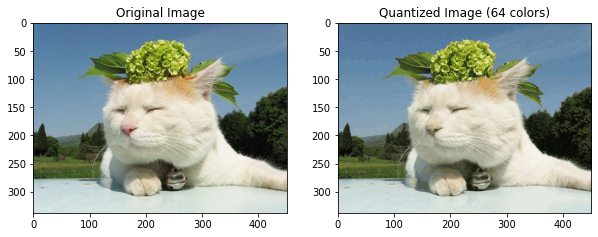

In [312]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.utils import shuffle
from sklearn.metrics import pairwise_distances_argmin_min
from PIL import Image

# 加载图像
image = Image.open('input_image.jpg')
image = np.array(image)

# 转换图像形状为 (width * height, num_channels)
w, h, d = tuple(image.shape)
image_array = np.reshape(image, (w * h, d))

# 对图像进行颜色量化
n_colors = 64  # 选择的颜色数量
image_array_sample = shuffle(image_array, random_state=0)[:1000]  # 随机选取部分样本
kmeans = KMeans(n_clusters=n_colors, random_state=0).fit(image_array_sample)
labels = kmeans.predict(image_array)
# print(labels)
# print(kmeans.cluster_centers_)
# 将每个像素点映射到其最近的聚类中心颜色
quantized_image = kmeans.cluster_centers_[labels]
quantized_image = np.reshape(quantized_image, (w, h, d))

# 显示原始图像和压缩后的图像
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(quantized_image.astype(np.uint8))
plt.title('Quantized Image ({} colors)'.format(n_colors))

plt.show()


255
0.0 255.0
[[[ 72.85714286 109.28571429 182.14285714]
  [ 72.85714286 109.28571429 182.14285714]
  [ 72.85714286 109.28571429 182.14285714]
  ...
  [ 72.85714286  72.85714286 145.71428571]
  [ 72.85714286  72.85714286 145.71428571]
  [ 72.85714286  72.85714286 145.71428571]]

 [[ 72.85714286 109.28571429 182.14285714]
  [ 72.85714286 109.28571429 182.14285714]
  [ 72.85714286 109.28571429 182.14285714]
  ...
  [ 72.85714286  72.85714286 145.71428571]
  [ 72.85714286  72.85714286 145.71428571]
  [ 72.85714286  72.85714286 145.71428571]]

 [[ 72.85714286 109.28571429 182.14285714]
  [ 72.85714286 109.28571429 182.14285714]
  [ 72.85714286 109.28571429 182.14285714]
  ...
  [ 36.42857143  72.85714286 145.71428571]
  [ 36.42857143  72.85714286 145.71428571]
  [ 72.85714286  72.85714286 145.71428571]]

 ...

 [[ 72.85714286  72.85714286 182.14285714]
  [ 72.85714286  72.85714286 182.14285714]
  [ 72.85714286 109.28571429 182.14285714]
  ...
  [ 36.42857143  36.42857143  72.85714286]
  [ 

<Figure size 720x360 with 0 Axes>

<AxesSubplot:>

Text(0.5, 1.0, 'Original Image')

<AxesSubplot:>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Quantized Image (8 Levels)')

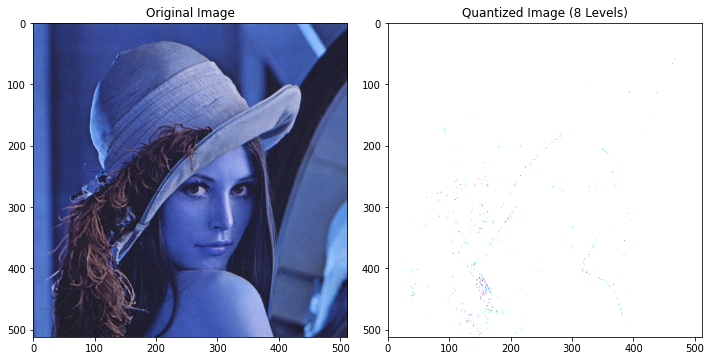

In [27]:
import numpy as np
import matplotlib.pyplot as plt

def quantize_image(image, num_levels):
    # 将图像数据转换为浮点数
    print(np.max(image))
    image_float = image.astype(float)
    
    # 计算最小值和最大值
    min_val = np.min(image_float)
    max_val = np.max(image_float)
    print(min_val, max_val)
    # 计算量化间隔
    interval = (max_val - min_val) / (num_levels - 1)
    
    # 对图像数据进行量化
    quantized_image = np.round((image_float - min_val) / interval) * interval + min_val
    
    return quantized_image

# 读取图像
image = cv2.imread("lena.png")

# 设置量化级别数量
num_levels = 8

# 进行图像量化
quantized_image = quantize_image(image, num_levels)
print(quantized_image)
# 显示原始图像和量化后的图像
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap="gray")
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(quantized_image, cmap="gray")
plt.title(f"Quantized Image ({num_levels} Levels)")

plt.tight_layout()
plt.show()


In [32]:
import cv2
import numpy as np

# 读取图像
image = cv2.imread('lena.png', cv2.IMREAD_COLOR)

# 将图像转换为浮点数类型
image_float = image.astype(np.float32)

# 计算最小值和最大值
min_val = np.min(image_float)
max_val = np.max(image_float)

# 量化参数
num_levels = 8

# 计算量化间隔
interval = (max_val - min_val) / (num_levels - 1)
# interval = np.ceil(interval)
print(interval)
# 执行量化压缩
quantized_image = np.round((image_float - min_val) / interval) * interval + min_val

# 将浮点数图像转换回整数类型
quantized_image = quantized_image.astype(np.uint8)

# 保存压缩后的图像
cv2.imwrite('compressed_image.jpg', quantized_image)

# 计算压缩率
original_size = image.nbytes
compressed_size = quantized_image.nbytes
compression_ratio = original_size / compressed_size

print("Original Size:", original_size)
print("Compressed Size:", compressed_size)
print("Compression Ratio:", compression_ratio)


36.42857142857143


True

Original Size: 786432
Compressed Size: 786432
Compression Ratio: 1.0


In [31]:
import cv2
import numpy as np

# 读取图像
image = cv2.imread('lena.png', cv2.IMREAD_COLOR)

# 将图像转换为灰度图
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# 计算图像的最小值和最大值
min_val = np.min(gray_image)
max_val = np.max(gray_image)

# 量化参数
num_levels = 8

# 计算量化间隔
interval = (max_val - min_val) / (num_levels - 1)

# 执行量化压缩并整数化
quantized_image = np.round((gray_image - min_val) / interval) * interval + min_val
quantized_image = quantized_image.astype(np.uint8)

# 保存压缩后的图像
cv2.imwrite('compressed_image.jpg', quantized_image)

# 计算压缩率
original_size = gray_image.nbytes
compressed_size = quantized_image.nbytes
compression_ratio = original_size / compressed_size

print("Original Size:", original_size)
print("Compressed Size:", compressed_size)
print("Compression Ratio:", compression_ratio)


True

Original Size: 262144
Compressed Size: 262144
Compression Ratio: 1.0


In [314]:
import numpy as np

# 原始数据
original_data = np.random.random(100)  # 生成随机的实数数据

# 量化参数
num_levels = 8  # 量化级别数量

# 将数据映射到量化级别
quantized_data = np.round(original_data * (num_levels - 1)) / (num_levels - 1)

# 计算压缩率
original_size = original_data.nbytes
compressed_size = quantized_data.nbytes
compression_ratio = original_size / compressed_size

# 输出结果
print("Original Data:", original_data)
print("Quantized Data:", quantized_data)
print("Compression Ratio:", compression_ratio)


Original Data: [0.05 0.89 0.55 0.63 0.78 0.4  0.08 0.01 0.03 0.73 0.13 0.25 0.67 0.8
 0.16 0.77 0.83 0.13 0.06 0.66 0.35 0.25 0.85 0.28 0.24 0.26 0.17 0.5
 0.1  0.05 0.74 0.86 0.26 0.22 0.23 0.18 0.01 0.38 0.43 0.83 0.64 0.12
 0.67 0.75 0.19 0.33 0.49 0.99 0.3  0.06 0.45 0.42 0.74 0.26 0.46 0.33
 0.17 0.62 0.12 0.91 0.94 0.07 0.17 0.01 0.1  0.71 0.07 0.06 0.96 0.69
 0.31 0.45 0.46 0.5  0.86 0.81 0.66 0.89 0.61 0.05 0.33 0.58 0.05 0.9
 0.57 0.18 0.52 0.98 0.7  0.98 0.53 0.55 0.28 0.54 0.17 0.38 0.83 0.53
 0.73 0.47]
Quantized Data: [0.   0.86 0.57 0.57 0.71 0.43 0.14 0.   0.   0.71 0.14 0.29 0.71 0.86
 0.14 0.71 0.86 0.14 0.   0.71 0.29 0.29 0.86 0.29 0.29 0.29 0.14 0.57
 0.14 0.   0.71 0.86 0.29 0.29 0.29 0.14 0.   0.43 0.43 0.86 0.57 0.14
 0.71 0.71 0.14 0.29 0.43 1.   0.29 0.   0.43 0.43 0.71 0.29 0.43 0.29
 0.14 0.57 0.14 0.86 1.   0.   0.14 0.   0.14 0.71 0.14 0.   1.   0.71
 0.29 0.43 0.43 0.43 0.86 0.86 0.71 0.86 0.57 0.   0.29 0.57 0.   0.86
 0.57 0.14 0.57 1.   0.71 1.   0.57 0

In [317]:
import numpy as np

# 生成一个带有规律性的原始数据（例如正弦函数）
x = np.linspace(0, 10, 1000)
original_data = np.sin(x)

# 量化参数
num_levels = 4  # 较低的量化级别数量

# 将数据映射到量化级别
quantized_data = np.round(original_data * (num_levels - 1)) / (num_levels - 1)

# 计算压缩率
original_size = original_data.nbytes
compressed_size = quantized_data.nbytes
compression_ratio = original_size / compressed_size

# 输出结果
# print("Original Data:", original_data)
# print("Quantized Data:", quantized_data)
print("Compression Ratio:", compression_ratio)


Compression Ratio: 1.0


Original Data: [0.55038613 0.52583821 0.02486264 0.0623061  0.52918775 0.08127869
 0.61826197 0.62687936 0.55474188 0.21245378 0.62274876 0.36483559
 0.65536959 0.86778248 0.8986499  0.67515622 0.11016984 0.74383663
 0.79818778 0.5679465  0.36371844 0.47296126 0.02799223 0.42040576
 0.42394719 0.34927094 0.90850456 0.98998578 0.60702462 0.99900008
 0.58424104 0.80075811 0.33341855 0.02439469 0.66915352 0.05027163
 0.09032529 0.00245276 0.31739799 0.7670159  0.21493234 0.85354578
 0.73368057 0.94279582 0.8916971  0.20273702 0.57336839 0.12625491
 0.13900603 0.36771299 0.22780085 0.65251222 0.43111315 0.39059249
 0.07891657 0.62951127 0.31521803 0.66623707 0.84705456 0.16177889
 0.3820294  0.44772887 0.88887698 0.05516669 0.95715312 0.93440083
 0.54208489 0.6996397  0.75622241 0.67898565 0.80701785 0.44019186
 0.03993863 0.48416071 0.91357967 0.45467439 0.99683255 0.46395292
 0.88111752 0.27508577 0.14810914 0.67664738 0.28198656 0.5150746
 0.84241541 0.37954706 0.54741467 0.02752179 0.0

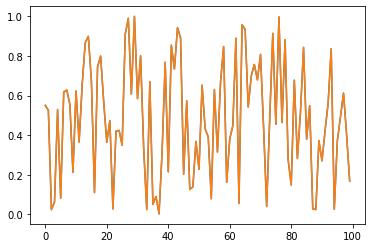

In [11]:
import numpy as np

# 原始数据
original_data = np.random.random(100)  # 生成随机的实数数据

# 量化参数
num_levels = 256  # 量化级别数量

# 数据量化
quantized_data = np.round(original_data * (num_levels - 1)).astype(int)

# 反量化（解压缩）
dequantized_data = quantized_data / (num_levels - 1)

# 计算压缩率
original_size = original_data.nbytes
compressed_size = quantized_data.nbytes
compression_ratio = original_size / compressed_size

# 输出结果
print("Original Data:", original_data)
print("Quantized Data:", quantized_data)
print("Dequantized Data:", dequantized_data)
print("Compression Ratio:", compression_ratio)
plt.plot(original_data)
plt.plot(dequantized_data)
np.save("original_data.npy", original_data)
np.save("dequantized_data.npy", dequantized_data)

In [18]:
!ls -lh

total 35M
drwxrwxr-x 8 wenquanshan wenquanshan 4.0K Aug 27  2022 01guangjian
-rw-rw-r-- 1 wenquanshan wenquanshan 9.9M Aug 30  2022 01guangjian.zip
-rwxrwxr-x 1 wenquanshan wenquanshan  30K Sep  1  2022 add_cc.cpython-39-x86_64-linux-gnu.so
-rw-rw-r-- 1 wenquanshan wenquanshan  228 Aug  3 15:59 a.npy
-rw-rw-r-- 1 wenquanshan wenquanshan    5 Aug 10  2022 a.txt
-rw-rw-r-- 1 wenquanshan wenquanshan 126K Aug 11  2022 cat01.jpg
-rw-rw-r-- 1 wenquanshan wenquanshan  52K Aug  3 19:17 compressed_image.jpg
-rw-rw-r-- 1 wenquanshan wenquanshan  65K Aug  3 19:17 decompressed_image.jpg
-rw-rw-r-- 1 wenquanshan wenquanshan 241K Aug  3 13:28 decrypted_image.png
-rw-rw-r-- 1 wenquanshan wenquanshan  928 Aug  4 15:41 dequantized_data.npy
-rw-rw-r-- 1 wenquanshan wenquanshan 448K Aug  3 13:28 encrypted_image.png
-rw-rw-r-- 1 wenquanshan wenquanshan  11M Sep  7  2022 face.ply
-rw-rw-r-- 1 wenquanshan wenquanshan  11M Aug  4 15:42 hjimi_test01.ipynb
-rw-rw-r-- 1 wenquanshan wenquanshan 5.1K Jun 20 15:56

# 图像加密解密

In [175]:
from PIL import Image
import numpy as np

def encrypt_image(image_path, key):
    # 打开图像
    image = Image.open(image_path)
    # 将图像转换为 numpy 数组
    image_array = np.array(image)

    # 对图像数组进行异或操作
    encrypted_array = image_array ^ key
    print(encrypted_array.shape)

    # 创建加密后的图像
    encrypted_image = Image.fromarray(encrypted_array)
    encrypted_image.save('encrypted_image.png')

def decrypt_image(encrypted_image_path, key):
    # 打开加密图像
    encrypted_image = Image.open(encrypted_image_path)
    # 将图像转换为 numpy 数组
    encrypted_array = np.array(encrypted_image)

    # 对图像数组进行异或操作
    decrypted_array = encrypted_array ^ key

    # 创建解密后的图像
    decrypted_image = Image.fromarray(decrypted_array)
    decrypted_image.save('decrypted_image.png')

def main():
    image_path = 'cat01.jpg'
    key = 250  # 加密密钥

    # 加密图像
    encrypt_image(image_path, key)

    encrypted_image_path = 'encrypted_image.png'

    # 解密图像
    decrypt_image(encrypted_image_path, key)

if __name__ == "__main__":
    main()


(338, 451, 3)


In [184]:
from PIL import Image

# 加密图像
def encrypt_image(image_path, output_path, key):
    image = Image.open(image_path)
    encrypted_image = image.copy()

    width, height = image.size

    for y in range(height):
        for x in range(width):
            r, g, b = image.getpixel((x, y))

            encrypted_r = r ^ key
            encrypted_g = g ^ (key+1)
            encrypted_b = b ^ (key+2)

            encrypted_image.putpixel((x, y), (encrypted_r, encrypted_g, encrypted_b))

    encrypted_image.save(output_path)

# 解密图像
def decrypt_image(encrypted_image_path, output_path, key):
    encrypted_image = Image.open(encrypted_image_path)
    decrypted_image = encrypted_image.copy()

    width, height = encrypted_image.size

    for y in range(height):
        for x in range(width):
            encrypted_r, encrypted_g, encrypted_b = encrypted_image.getpixel((x, y))

            decrypted_r = encrypted_r ^ key
            decrypted_g = encrypted_g ^ (key+1)
            decrypted_b = encrypted_b ^ (key+2)

            decrypted_image.putpixel((x, y), (decrypted_r, decrypted_g, decrypted_b))

    decrypted_image.save(output_path)

def main():
    image_path = 'cat01.jpg'
    encrypted_image_path = 'encrypted_image.png'
    decrypted_image_path = 'decrypted_image.png'
    key = 123  # 加密密钥

    # 加密图像
    encrypt_image(image_path, encrypted_image_path, key)

    # 解密图像
    decrypt_image(encrypted_image_path, decrypted_image_path, key)

if __name__ == "__main__":
    main()


In [191]:
from PIL import Image
import numpy as np

def encrypt_image(image_path, output_path, key):
    image = Image.open(image_path)
    encrypted_image = image.copy()

    width, height = image.size

    np.random.seed(key)  # 设置随机种子

    # 生成随机置换序列
    permutation = np.arange(width * height)
    np.random.shuffle(permutation)

    # 对图像像素进行置换
    pixels = np.array(image)
    encrypted_pixels = pixels.reshape(-1, 3)[permutation, :].reshape(height, width, 3)

    encrypted_image = Image.fromarray(encrypted_pixels.astype(np.uint8))

    encrypted_image.save(output_path)

def decrypt_image(encrypted_image_path, output_path, key):
    encrypted_image = Image.open(encrypted_image_path)
    decrypted_image = encrypted_image.copy()

    width, height = encrypted_image.size

    np.random.seed(key)  # 设置随机种子

    # 生成相应的逆置换序列
    permutation = np.arange(width * height)
    np.random.shuffle(permutation)
#     print(permutation)
    inverse_permutation = np.argsort(permutation)
#     print(inverse_permutation)
    # 对图像像素进行逆置换
    pixels = np.array(encrypted_image)
    decrypted_pixels = pixels.reshape(-1, 3)[inverse_permutation, :].reshape(height, width, 3)

    decrypted_image = Image.fromarray(decrypted_pixels.astype(np.uint8))

    decrypted_image.save(output_path)

def main():
    image_path = 'cat01.jpg'
    encrypted_image_path = 'encrypted_image.png'
    decrypted_image_path = 'decrypted_image.png'
    key = 123  # 加密密钥

    # 加密图像
    encrypt_image(image_path, encrypted_image_path, key)

    # 解密图像
    decrypt_image(encrypted_image_path, decrypted_image_path, key)

if __name__ == "__main__":
    main()


/tmp/ipykernel_10644/1118358491.py:27: RuntimeWarning: invalid value encountered in divide
  fshift_decrypted = fshift_filtered / mask


<AxesSubplot:>

Text(0.5, 1.0, 'Original Image')

(-0.5, 511.5, 511.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Encrypted Image')

(-0.5, 511.5, 511.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Decrypted Image')

(-0.5, 511.5, 511.5, -0.5)

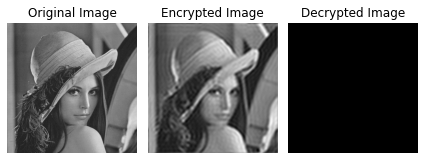

In [35]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 加载图像
image_path = 'lena.png'  # 图像路径
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# 进行傅里叶变换
f = np.fft.fft2(original_image)
fshift = np.fft.fftshift(f)

# 设计一个频域滤波器（加密密钥）
rows, cols = original_image.shape
center_row, center_col = rows // 2, cols // 2
mask = np.zeros((rows, cols), dtype=np.uint8)
mask[center_row-30:center_row+30, center_col-30:center_col+30] = 1

# 将滤波器应用于频域数据
fshift_filtered = fshift * mask

# 进行逆傅里叶变换，得到加密后的图像
encrypted_image = np.fft.ifft2(np.fft.ifftshift(fshift_filtered))
encrypted_image = np.abs(encrypted_image).astype(np.uint8)

# 解密过程，将滤波器反转应用于频域数据
fshift_decrypted = fshift_filtered / mask

# 进行逆傅里叶变换，得到解密后的图像
decrypted_image = np.fft.ifft2(np.fft.ifftshift(fshift_decrypted))
decrypted_image = np.abs(decrypted_image).astype(np.uint8)

# 显示原始图像、加密后的图像和解密后的图像
plt.subplot(1, 3, 1)
plt.imshow(original_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(encrypted_image, cmap='gray')
plt.title('Encrypted Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(decrypted_image, cmap='gray')
plt.title('Decrypted Image')
plt.axis('off')

plt.tight_layout()
plt.show()


[[ -960.32485793   +0.j           213.21593105-1060.73080006j
   -307.10160328 +581.68505807j ...  -160.22120335-1116.881999j
   -166.31309548 -315.01575235j    41.49743832 +206.44616346j]
 [  102.04607511 -159.36581891j   208.8157609   +35.56057355j
   -761.88590495 +294.60367238j ...   249.82421513  +54.54611936j
    130.7545434  -571.60188539j  -397.43308657  -99.23091141j]
 [  -41.71942301 +207.07912477j   511.02104277 -276.00045157j
   -272.35820953 -118.56547558j ...  -358.95378021 -174.24536997j
    670.87025985+1149.92504244j  -791.56363316 +152.12306107j]
 ...
 [ -628.1094799  +391.90756975j  -266.13646305 +954.44471628j
    535.88320491 +562.01810593j ...  -829.20688893 +115.00355086j
    296.17506231  -30.74954498j   483.56231022 -178.47711967j]
 [  -33.81966691 -167.86778244j -1037.00891927 -199.29284841j
     39.20371945  -67.19829668j ...  -193.32649083 +102.06635128j
   -110.21419141  +47.97945339j   638.32745833 +344.75814497j]
 [   18.82947118  +29.40607065j  -798.8909

<AxesSubplot:>

Text(0.5, 1.0, 'Original Image')

(-0.5, 511.5, 511.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Encrypted Image')

(-0.5, 511.5, 511.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Decrypted Image')

(-0.5, 511.5, 511.5, -0.5)

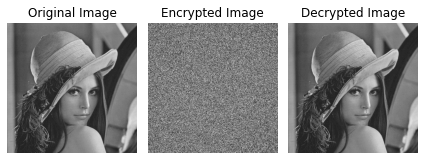

In [41]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def encrypt_image(image, key):
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    encrypted_image = fshift * key
    return encrypted_image

def decrypt_image(encrypted_image, key):
    fshift_decrypted = encrypted_image / key
    decrypted_image = np.fft.ifft2(np.fft.ifftshift(fshift_decrypted))
    return np.abs(decrypted_image).astype(np.uint8)

# 加载图像
image_path = 'lena.png'  # 图像路径
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# 生成加密密钥
rows, cols = original_image.shape

key = np.random.rand(rows, cols)
# print(key)
# 加密图像
encrypted_image = encrypt_image(original_image, key)
# print(encrypted_image)
# 解密图像
decrypted_image = decrypt_image(encrypted_image, key)

# 显示原始图像、加密后的图像和解密后的图像
plt.subplot(1, 3, 1)
plt.imshow(original_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(np.abs(encrypted_image).astype(np.uint8), cmap='gray')
plt.title('Encrypted Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(decrypted_image, cmap='gray')
plt.title('Decrypted Image')
plt.axis('off')

plt.tight_layout()
plt.show()


## 怎样用一张图像可逆的表示图像傅里叶变换后的结果

26296391.0 4.152220367187619
3.141592653589793 -3.1415846051163236
17.084942301425304 1.6394277610215509


<Figure size 720x432 with 0 Axes>

<AxesSubplot:>

Text(0.5, 1.0, 'Original Image')

(-0.5, 511.5, 511.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Magnitude Spectrum')

(-0.5, 511.5, 511.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Phase Spectrum')

(-0.5, 511.5, 511.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Reconstructed Image')

(-0.5, 511.5, 511.5, -0.5)

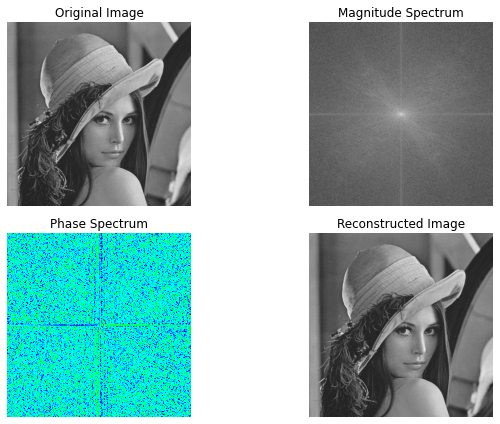

In [50]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
np.set_printoptions(precision=2, threshold=100, suppress=True)
# 加载图像
image_path = 'lena.png'  # 图像路径
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# 进行傅里叶变换
f = np.fft.fft2(image)
fshift = np.fft.fftshift(f)

# 计算幅度和相位图像
magnitude = np.abs(fshift)
phase = np.angle(fshift)
# print(magnitude)
# print(phase)
print(np.max(magnitude), np.min(magnitude))
print(np.max(phase), np.min(phase))
a = np.log(1 + magnitude)
print(np.max(a), np.min(a))
# 将幅度和相位图像进行逆操作，重建原始图像
reconstructed_fshift = magnitude * np.exp(1j * phase)
reconstructed_f = np.fft.ifftshift(reconstructed_fshift)
reconstructed_image = np.fft.ifft2(reconstructed_f).real

# 显示原始图像、幅度图像、相位图像和重建图像
plt.figure(figsize=(10, 6))

plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(np.log(1 + magnitude), cmap='gray')
plt.title('Magnitude Spectrum')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(phase, cmap='hsv')
plt.title('Phase Spectrum')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(reconstructed_image, cmap='gray')
plt.title('Reconstructed Image')
plt.axis('off')

plt.tight_layout()
plt.show()


In [61]:
np.angle?


## 怎样用一张图像可逆的表示图像dct变换后的结果 

<Figure size 720x360 with 0 Axes>

<AxesSubplot:>

Text(0.5, 1.0, 'Original Image')

(-0.5, 511.5, 511.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Reconstructed Image')

(-0.5, 511.5, 511.5, -0.5)

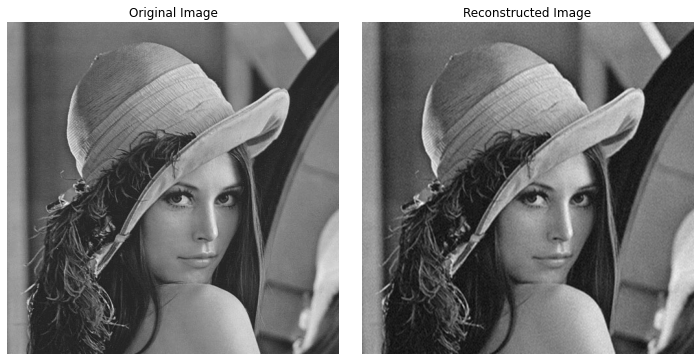

In [53]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 加载图像
image_path = 'lena.png'  # 图像路径
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# 进行离散余弦变换（DCT）
dct_image = cv2.dct(np.float32(image))

# 选择要保留的DCT系数百分比（低频部分）
keep_percentage = 0.1

# 获取DCT系数的绝对值，并按大小排序
abs_dct = np.abs(dct_image)
# print(abs_dct)
sorted_coeffs = np.sort(abs_dct.ravel())[::-1]

# 计算要保留的系数数量
total_coeffs = dct_image.size
num_coeffs_to_keep = int(total_coeffs * keep_percentage)

# 获取阈值，以保留指定百分比的低频系数
threshold = sorted_coeffs[num_coeffs_to_keep]

# 应用阈值，将高频系数置零
dct_image[np.abs(dct_image) < threshold] = 0

# 进行逆离散余弦变换（IDCT）以重建图像
reconstructed_image = cv2.idct(dct_image)

# 显示原始图像和重建图像
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image, cmap='gray')
plt.title('Reconstructed Image')
plt.axis('off')

plt.tight_layout()
plt.show()


True

<Figure size 720x360 with 0 Axes>

<AxesSubplot:>

Text(0.5, 1.0, 'Original Image')

(-0.5, 511.5, 511.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Reconstructed Image from DCT Coefficients')

(-0.5, 511.5, 511.5, -0.5)

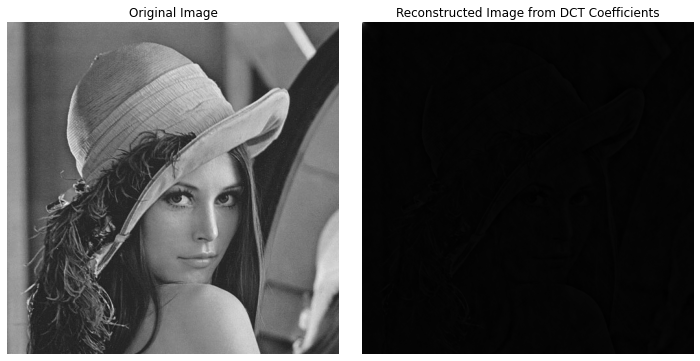

In [54]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 加载图像
image_path = 'lena.png'  # 图像路径
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# 进行离散余弦变换（DCT）
dct_image = cv2.dct(np.float32(image))

# 将DCT系数保存为图像文件
cv2.imwrite('dct_coefficients.png', dct_image)

# 加载保存的DCT系数图像
loaded_dct_image = cv2.imread('dct_coefficients.png', cv2.IMREAD_GRAYSCALE)

# 进行逆离散余弦变换（IDCT）以重建图像
reconstructed_image = cv2.idct(np.float32(loaded_dct_image))

# 显示原始图像和重建图像
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image, cmap='gray')
plt.title('Reconstructed Image from DCT Coefficients')
plt.axis('off')

plt.tight_layout()
plt.show()


<Figure size 720x360 with 0 Axes>

<AxesSubplot:>

Text(0.5, 1.0, 'Original Image')

(-0.5, 511.5, 511.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Reconstructed Image from DCT Coefficients')

(-0.5, 511.5, 511.5, -0.5)

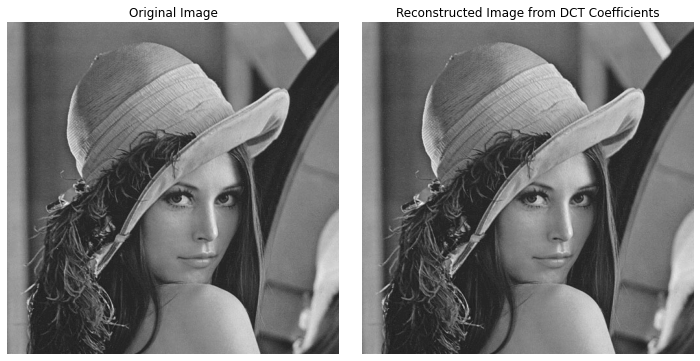

In [55]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 加载图像
image_path = 'lena.png'  # 图像路径
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# 进行离散余弦变换（DCT）
dct_image = cv2.dct(np.float32(image))

# 将DCT系数保存为文本文件
np.savetxt('dct_coefficients.txt', dct_image)

# 加载保存的DCT系数
loaded_dct_image = np.loadtxt('dct_coefficients.txt')

# 进行逆离散余弦变换（IDCT）以重建图像
reconstructed_image = cv2.idct(loaded_dct_image)

# 显示原始图像和重建图像
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image, cmap='gray')
plt.title('Reconstructed Image from DCT Coefficients')
plt.axis('off')

plt.tight_layout()
plt.show()


In [58]:
a = np.arange(24).reshape(6, 4)
np.savetxt('a.txt', a)

## other

In [177]:
!pip install cryptography


Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple

[notice] A new release of pip is available: 23.0.1 -> 23.2.1
[notice] To update, run: pip install --upgrade pip


In [181]:
from cryptography.hazmat.primitives import serialization
from cryptography.hazmat.primitives import hashes
from cryptography.hazmat.primitives.asymmetric import padding
from cryptography.hazmat.primitives.asymmetric import rsa
from PIL import Image

# 生成 RSA 密钥对
def generate_rsa_key_pair():
    private_key = rsa.generate_private_key(
        public_exponent=65537,
        key_size=2048
    )
    public_key = private_key.public_key()
    return private_key, public_key

# 使用 RSA 公钥加密图像
def encrypt_image(image_path, public_key):
    # 打开图像
    image = Image.open(image_path)
    image_data = image.tobytes()

    # 加密图像数据
    encrypted_data = public_key.encrypt(
        image_data,
        padding.OAEP(
            mgf=padding.MGF1(algorithm=hashes.SHA256()),
            algorithm=hashes.SHA256(),
            label=None
        )
    )

    # 保存加密后的图像数据
    with open('encrypted_image', 'wb') as f:
        f.write(encrypted_data)

# 使用 RSA 私钥解密图像
def decrypt_image(encrypted_image_path, private_key):
    # 读取加密后的图像数据
    with open(encrypted_image_path, 'rb') as f:
        encrypted_data = f.read()

    # 解密图像数据
    decrypted_data = private_key.decrypt(
        encrypted_data,
        padding.OAEP(
            mgf=padding.MGF1(algorithm=hashes.SHA256()),
            algorithm=hashes.SHA256(),
            label=None
        )
    )

    # 保存解密后的图像数据
    decrypted_image = Image.frombytes('RGB', (image_width, image_height), decrypted_data)
    decrypted_image.save('decrypted_image.png')

def main():
    image_path = 'cat01.jpg'

    # 生成 RSA 密钥对
    private_key, public_key = generate_rsa_key_pair()
    print(private_key, public_key)
    # 加密图像
    encrypt_image(image_path, public_key)

    encrypted_image_path = 'encrypted_image'

    # 解密图像
    decrypt_image(encrypted_image_path, private_key)

if __name__ == "__main__":
    main()


<cryptography.hazmat.backends.openssl.rsa._RSAPrivateKey object at 0x7f8105539730> <cryptography.hazmat.backends.openssl.rsa._RSAPublicKey object at 0x7f81054cd370>


ValueError: Encryption/decryption failed.

# 隐写术

In [200]:
from PIL import Image

# 将文本信息嵌入图像
def embed_text_into_image(input_image_path, output_image_path, text):
    image = Image.open(input_image_path)
    width, height = image.size

    binary_text = ''.join(format(ord(char), '08b') for char in text)

    if len(binary_text) > width * height * 3:
        raise ValueError("文本信息太长，无法嵌入到图像中")

    text_index = 0
    encrypted_pixels = []

    for y in range(height):
        for x in range(width):
            pixel = list(image.getpixel((x, y)))
            
            for color_channel in range(3):
                if text_index < len(binary_text):
                    pixel[color_channel] &= 0b11111110
                    pixel[color_channel] |= int(binary_text[text_index])
                    text_index += 1

            encrypted_pixels.append(tuple(pixel))

    encrypted_image = Image.new('RGB', (width, height))
    encrypted_image.putdata(encrypted_pixels)
    encrypted_image.save(output_image_path)

# 从图像中提取隐藏的文本信息
def extract_text_from_image(image_path):
    image = Image.open(image_path)
    width, height = image.size

    binary_text = ''

    for y in range(height):
        for x in range(width):
            pixel = image.getpixel((x, y))
            
            for color_channel in range(3):
                binary_text += str(pixel[color_channel] & 1)

    text = ''.join(chr(int(binary_text[i:i+8], 2)) for i in range(0, len(binary_text), 8))
    return text

def main():
    input_image_path = 'cat01.jpg'
    output_image_path = 'output_image.png'
    secret_text = "This is a hidden message in an image."

    # 将文本信息嵌入图像
    embed_text_into_image(input_image_path, output_image_path, secret_text)

    # 从图像中提取隐藏的文本信息
    extracted_text = extract_text_from_image(output_image_path)
#     print("Extracted Text:", extracted_text)

if __name__ == "__main__":
    main()


## LSB（最低有效位）隐写术

In [208]:
from PIL import Image

# 将文本信息嵌入图像
def embed_text_into_image(input_image_path, output_image_path, text):
    image = Image.open(input_image_path)
    width, height = image.size

    binary_text = ''.join(format(ord(char), '08b') for char in text)
    print(binary_text, text)
    if len(binary_text) > width * height * 3:
        raise ValueError("文本信息太长，无法嵌入到图像中")

    text_index = 0
    encrypted_pixels = []
    print(len(binary_text))
    for y in range(height):
        for x in range(width):
            pixel = list(image.getpixel((x, y)))
#             print(pixel)
            
            for color_channel in range(3):
                if text_index < len(binary_text):
                    pixel[color_channel] &= 0b11111110
                    pixel[color_channel] |= int(binary_text[text_index])
                    text_index += 1

            encrypted_pixels.append(tuple(pixel))

    encrypted_image = Image.new('RGB', (width, height))
    encrypted_image.putdata(encrypted_pixels)
    encrypted_image.save(output_image_path)

# 从图像中提取隐藏的文本信息
def extract_text_from_image(image_path):
    image = Image.open(image_path)
    width, height = image.size

    binary_text = ''

    for y in range(height):
        for x in range(width):
            pixel = image.getpixel((x, y))
            
            for color_channel in range(3):
                binary_text += str(pixel[color_channel] & 1)
    print(len(binary_text))
    print(binary_text[:296])
    binary_text = binary_text[:296]
    text = ''.join(chr(int(binary_text[i:i+8], 2)) for i in range(0, len(binary_text), 8))
    return text

def main():
    input_image_path = 'cat01.jpg'
    output_image_path = 'output_image.png'
    secret_text = "This is a hidden message in an image."

    # 将文本信息嵌入图像
    embed_text_into_image(input_image_path, output_image_path, secret_text)

    # 从图像中提取隐藏的文本信息
    extracted_text = extract_text_from_image(output_image_path)
    print("Extracted Text:", extracted_text)

if __name__ == "__main__":
    main()


01010100011010000110100101110011001000000110100101110011001000000110000100100000011010000110100101100100011001000110010101101110001000000110110101100101011100110111001101100001011001110110010100100000011010010110111000100000011000010110111000100000011010010110110101100001011001110110010100101110 This is a hidden message in an image.
296
457314
01010100011010000110100101110011001000000110100101110011001000000110000100100000011010000110100101100100011001000110010101101110001000000110110101100101011100110111001101100001011001110110010100100000011010010110111000100000011000010110111000100000011010010110110101100001011001110110010100101110
Extracted Text: This is a hidden message in an image.


In [105]:
from PIL import Image

# 加载图像
image_path = 'input_image.png'
image = Image.open(image_path)

# 将文本信息嵌入图像的LSB中
def embed_text_lsb(image, text):
    pixels = image.load()
    text = text + '\0'  # 添加一个空字符作为终止符
    text_binary = ''.join(format(ord(char), '08b') for char in text)
    
    text_index = 0
    for i in range(image.width):
        for j in range(image.height):
            pixel = list(pixels[i, j])
            for k in range(3):  # 遍历RGB通道
                if text_index < len(text_binary):
                    pixel[k] = int(format(pixel[k], '08b')[:-1] + text_binary[text_index], 2)
                    text_index += 1
            pixels[i, j] = tuple(pixel)
    
    return image

# 从图像的LSB中提取文本信息
def extract_text_lsb(image, size):
    pixels = image.load()
    extracted_text_binary = ''
    
    for i in range(image.width):
        for j in range(image.height):
            pixel = pixels[i, j]
            for k in range(3):
                extracted_text_binary += format(pixel[k], '08b')[-1]
    
    extracted_text = ''.join(chr(int(extracted_text_binary[i:i+8], 2)) for i in range(0, size, 8))
    return extracted_text.strip('\0')

# 嵌入文本信息
secret_text = "This is a hidden message."
image_with_secret = embed_text_lsb(image.copy(), secret_text)

# 从图像中提取隐藏的文本信息
extracted_text = extract_text_lsb(image_with_secret, len(secret_text) * 8)
print("Extracted Text:", extracted_text)

# 保存嵌入了信息的图像
output_image_path = 'output_image_lsb.png'
image_with_secret.save(output_image_path)


Extracted Text: This is a hidden message.


## DCT（离散余弦变换）隐写术

In [67]:
# %cp path_to_your_image.png input_image.png

In [215]:
import numpy as np
from scipy.fftpack import dct, idct
from PIL import Image

# 加载图像
image_path = 'input_image.png'
image = Image.open(image_path)

# 将文本信息嵌入图像的DCT系数中
def embed_text_dct(image, text):
    pixels = np.array(image)
    text = text + '\0'  # 添加一个空字符作为终止符
    text_binary = ''.join(format(ord(char), '08b') for char in text)
    print(text_binary)
    text_index = 0
    for i in range(0, image.width, 8):
        for j in range(0, image.height, 8):
            block = pixels[i:i+8, j:j+8]
            if text_index < len(text_binary) and block.shape == (8, 8, 3):
                block[7, 7, 0] = int(text_binary[text_index], 2)
                text_index += 1
                pixels[i:i+8, j:j+8] = block
    print(len(text))
    return Image.fromarray(pixels)

# 从图像的DCT系数中提取文本信息
def extract_text_dct(image, size):
    pixels = np.array(image)
    extracted_text_binary = ''
    
    for i in range(0, image.width, 8):
        for j in range(0, image.height, 8):
            block = pixels[i:i+8, j:j+8]
            if block.shape == (8, 8, 3):
#                 print(type(block[7,7,0]), block[7,7,0].shape)
#                 x = int(block[7, 7, 0])
#                 print(x)
                extracted_text_binary += f"{int(block[7, 7, 0])}"
#                 try:
#                     extracted_text_binary += int(block[7, 7, 0])
#                 except:
#                     print(block[7,7,0])
#                 extracted_text_binary += format(int(block[7, 7, 0]), '08b')
#     print(len(extracted_text_binary))
#     print(extracted_text_binary)
    extracted_text = ''.join(chr(int(extracted_text_binary[i:i+8], 2)) for i in range(0, size, 8))
    return extracted_text.strip('\0')

# 嵌入文本信息
secret_text = "This is a hidden message."
image_with_secret = embed_text_dct(image.copy(), secret_text)

# 从图像中提取隐藏的文本信息
extracted_text = extract_text_dct(image_with_secret, len(secret_text) * 8)
print("Extracted Text:", extracted_text)

# 保存嵌入了信息的图像
output_image_path = 'output_image_dct.png'
image_with_secret.save(output_image_path)


0101010001101000011010010111001100100000011010010111001100100000011000010010000001101000011010010110010001100100011001010110111000100000011011010110010101110011011100110110000101100111011001010010111000000000
26
Extracted Text: This is a hidden message.


In [179]:
import numpy as np
from scipy.fftpack import dct, idct
from PIL import Image

# 加载图像
image_path = 'input_image.png'
image = Image.open(image_path)

# 将文本信息嵌入图像的DCT系数中
def embed_text_dct(image, text):
    pixels = np.array(image)
    text = text + '\0'  # 添加一个空字符作为终止符
    text_binary = ''.join(format(ord(char), '08b') for char in text)
    print(text_binary)
    text_index = 0
    for i in range(0, image.width, 8):
        for j in range(0, image.height, 8):
            block = pixels[i:i+8, j:j+8]
            if text_index < len(text_binary) and block.shape == (8, 8, 3):
                block[7, 7, 0] = int(text_binary[text_index], 2)
                text_index += 1
                pixels[i:i+8, j:j+8] = block
    print(len(text))
    return Image.fromarray(pixels)

# 从图像的DCT系数中提取文本信息
def extract_text_dct(image):
    pixels = np.array(image)
    extracted_text_binary = ''
    
    for i in range(0, image.width, 8):
        for j in range(0, image.height, 8):
            block = pixels[i:i+8, j:j+8]
            if block.shape == (8, 8, 3):
#                 print(type(block[7,7,0]), block[7,7,0].shape)
#                 x = int(block[7, 7, 0])
#                 print(x)
                extracted_text_binary += f"{int(block[7, 7, 0])}"
#                 try:
#                     extracted_text_binary += int(block[7, 7, 0])
#                 except:
#                     print(block[7,7,0])
#                 extracted_text_binary += format(int(block[7, 7, 0]), '08b')
#     print(len(extracted_text_binary))
#     print(extracted_text_binary)
#     extracted_text = ''.join(chr(int(extracted_text_binary[i:i+8], 2)) for i in range(0, len(extracted_text_binary), 8))
    extracted_text = ''
    for i in range(0, len(extracted_text_binary), 8):
        x = int(extracted_text_binary[i:i+8], 2)
        if (x == 0):
            break
        extracted_text += chr(x)
            
    
    return extracted_text.strip('\0')

# 嵌入文本信息
secret_text = "This is a hidden message."
image_with_secret = embed_text_dct(image.copy(), secret_text)

# 从图像中提取隐藏的文本信息
extracted_text = extract_text_dct(image_with_secret)
print("Extracted Text:", extracted_text)

# 保存嵌入了信息的图像
output_image_path = 'output_image_dct.png'
image_with_secret.save(output_image_path)


0101010001101000011010010111001100100000011010010111001100100000011000010010000001101000011010010110010001100100011001010110111000100000011011010110010101110011011100110110000101100111011001010010111000000000
26
Extracted Text: This is a hidden message.


In [217]:
import numpy as np
from scipy.fftpack import dct, idct
from PIL import Image

# 加载图像并转为灰度图像
image_path = 'input_image.png'
image = Image.open(image_path).convert('L')

# 将文本信息嵌入图像的DCT系数中
def embed_text_dct(image, text):
    pixels = np.array(image)
    text = text + '\0'  # 添加一个空字符作为终止符
    text_binary = ''.join(format(ord(char), '08b') for char in text)
    
    text_index = 0
    for i in range(0, image.width, 8):
        for j in range(0, image.height, 8):
            block = pixels[i:i+8, j:j+8]
            if (block.shape != (8, 8)):
                continue
            block_dct = dct(dct(block, axis=0, norm='ortho'), axis=1, norm='ortho')
            
            # 只使用DCT系数的实数部分
            fraction_part = block_dct[0, 0]  # 使用DCT系数的左上角位置
            if text_index < len(text_binary):
                bit = int(text_binary[text_index])
                fraction_part_new = (int(fraction_part * 100) & 254) | bit
                block_dct[0, 0] = fraction_part_new / 100
                text_index += 1
            
            block = idct(idct(block_dct, axis=0, norm='ortho'), axis=1, norm='ortho')
            
            pixels[i:i+8, j:j+8] = block
    
    return Image.fromarray(pixels)

# 从图像的DCT系数中提取文本信息
def extract_text_dct(image, size):
    pixels = np.array(image)
    extracted_text_binary = ''
    
    for i in range(0, image.width, 8):
        for j in range(0, image.height, 8):
            block = pixels[i:i+8, j:j+8]
            if (block.shape != (8, 8)):
                continue
            block_dct = dct(dct(block, axis=0, norm='ortho'), axis=1, norm='ortho')
            fraction_part = block_dct[0, 0]  # 使用DCT系数的左上角位置
            fraction_binary = format(int(fraction_part * 100), '08b')
            extracted_text_binary += fraction_binary
    
    extracted_text = ''
    for i in range(0, size * 8, 8):
        extracted_char = extracted_text_binary[i:i+8]
        if extracted_char == '00000000':
            break
        extracted_text += chr(int(extracted_char, 2))
    
    return extracted_text.rstrip('\0')  # 去除终止字符

# 嵌入文本信息
secret_text = "This is a hidden message."
image_with_secret = embed_text_dct(image.copy(), secret_text)

# 从图像中提取隐藏的文本信息
extracted_text = extract_text_dct(image_with_secret, len(secret_text))
print("Extracted Text:", extracted_text)

# 保存嵌入了信息的图像
output_image_path = 'output_image_dct.png'
image_with_secret.save(output_image_path)


Extracted Text: á®ÎÈá»ÊÕ!ûw©?kö©H


cv2.dct, 完成版

In [297]:
import numpy as np
# from scipy.fftpack import dct, idct
from PIL import Image

# 加载图像并转为灰度图像
image_path = 'input_image.png'
image = Image.open(image_path).convert('L')
image1 = np.array(image).astype(np.float64)
# print(np.array(image))
# 将文本信息嵌入图像的DCT系数中
def embed_text_dct(image, text):
    pixels = np.array(image).astype(np.float32)
    text = text + '\0'  # 添加一个空字符作为终止符
    text_binary = ''.join(format(ord(char), '08b') for char in text)
    
    text_index = 0
    print(f"{len(text_binary)=}, {text_binary=}")
    for i in range(0, image.width, 8):
        for j in range(0, image.height, 8):
#             print(f"{i=},{j=}")
            block = pixels[i:i+8, j:j+8]
            if (block.shape != (8, 8)):
                continue
            block_dct = cv2.dct(block)
            
            # 只使用DCT系数的实数部分
            fraction_part = np.abs(block_dct[7, 7])  # 使用DCT系数的右下角位置
#             print(block_dct[7, 7])
            if text_index < len(text_binary):
                bit = int(text_binary[text_index])
#                 print(bit)
                fraction_part_new = (int(fraction_part * 100) & 254) | bit
                block_dct[7, 7] = fraction_part_new / 100
#                 print(block_dct[7, 7])
                text_index += 1
#             print("---")
            block = cv2.idct(block_dct)
            
            pixels[i:i+8, j:j+8] = block
    
    return Image.fromarray(pixels)

# 从图像的DCT系数中提取文本信息
def extract_text_dct(image, size):
    pixels = np.array(image).astype(np.float32)
    extracted_text_binary = ''
    print(f"{size=}")
    k = 0
    flag = False
    for i in range(0, image.width, 8):
        for j in range(0, image.height, 8):
            block = pixels[i:i+8, j:j+8]
            if (block.shape != (8, 8)):
                continue
            block_dct = cv2.dct(block)
            fraction_part = np.abs(block_dct[7, 7])  # 使用DCT系数的右下角位置
#             print(np.around(fraction_part*100))
#             fraction_binary = format(int(fraction_part * 100), '08b')
            fraction_binary = int(np.around(fraction_part*100)) & 1
#             print(int(fraction_binary, 2))
            extracted_text_binary += str(fraction_binary)
#             print(extracted_text_binary)
            k += 1
            if (k > size * 8):
                flag = True
                break
        if (flag):break
    
    extracted_text = ''
    for i in range(0, size * 8, 8):
        extracted_char = extracted_text_binary[i:i+8]
#         print(extracted_char)
        if extracted_char == '00000000':
            break
#         print(int(extracted_char, 2))
        extracted_text += chr(int(extracted_char, 2))
#         print(extracted_text)
    
    return extracted_text.rstrip('\0')  # 去除终止字符

# 嵌入文本信息
secret_text = "This is a hidden message."
image_with_secret = embed_text_dct(image.copy(), secret_text)
image2 = np.array(image_with_secret).astype(np.float32)
print(np.allclose(image1, image2))
# print(np.array(image_with_secret))
# image_with_secret = image_with_secret.convert("L")
# 从图像中提取隐藏的文本信息
extracted_text = extract_text_dct(image_with_secret, len(secret_text))
print("Extracted Text:", extracted_text)

# 保存嵌入了信息的图像
output_image_path = 'output_image_dct.png'
# image_with_secret.save(output_image_path)
# 010101000110100001101001011100110
# 0101010001101000011010010111001100000000

len(text_binary)=208, text_binary='0101010001101000011010010111001100100000011010010111001100100000011000010010000001101000011010010110010001100100011001010110111000100000011011010110010101110011011100110110000101100111011001010010111000000000'
False
size=25
Extracted Text: ;CÄã°%³àìx,6&ùf@dò`Õ


去掉size

In [295]:
import numpy as np
# from scipy.fftpack import dct, idct
from PIL import Image

# 加载图像并转为灰度图像
image_path = 'input_image.png'
image = Image.open(image_path).convert('L')
image1 = np.array(image).astype(np.float64)
# print(np.array(image))
# 将文本信息嵌入图像的DCT系数中
def embed_text_dct(image, text):
    pixels = np.array(image).astype(np.float32)
    text = text + '\0'  # 添加一个空字符作为终止符
    text_binary = ''.join(format(ord(char), '08b') for char in text)
    
    text_index = 0
    print(f"{len(text_binary)=}, {text_binary=}")
    for i in range(0, image.width, 8):
        for j in range(0, image.height, 8):
#             print(f"{i=},{j=}")
            block = pixels[i:i+8, j:j+8]
            if (block.shape != (8, 8)):
                continue
            block_dct = cv2.dct(block)
            
            # 只使用DCT系数的实数部分
            fraction_part = np.abs(block_dct[7, 7])  # 使用DCT系数的右下角位置
#             print(block_dct[7, 7])
            if text_index < len(text_binary):
                bit = int(text_binary[text_index])
#                 print(bit)
                fraction_part_new = (int(fraction_part * 100) & 254) | bit
                block_dct[7, 7] = fraction_part_new / 100
#                 print(block_dct[7, 7])
                text_index += 1
#             print("---")
            block = cv2.idct(block_dct)
            
            pixels[i:i+8, j:j+8] = block
    
    return Image.fromarray(pixels)

# 从图像的DCT系数中提取文本信息
def extract_text_dct(image):
    pixels = np.array(image).astype(np.float32)
    extracted_text_binary = ''
#     print(f"{size=}")
    k = 0
    flag = False
    for i in range(0, image.width, 8):
        for j in range(0, image.height, 8):
            block = pixels[i:i+8, j:j+8]
            if (block.shape != (8, 8)):
                continue
            block_dct = cv2.dct(block)
            fraction_part = np.abs(block_dct[7, 7])  # 使用DCT系数的右下角位置
#             print(np.around(fraction_part*100))
#             fraction_binary = format(int(fraction_part * 100), '08b')
            fraction_binary = int(np.around(fraction_part*100)) & 1
#             print(int(fraction_binary, 2))
            extracted_text_binary += str(fraction_binary)
            k += 1
            if (k % 8 == 0):
                laststr = extracted_text_binary[k-8:k]
#                 print(f"{laststr=}")
                if laststr == "00000000":
                    flag = True
                    break
        if flag:
            break
    
    extracted_text = ''
    for i in range(0, k, 8):
        extracted_char = extracted_text_binary[i:i+8]
#         print(extracted_char)
        if extracted_char == '00000000':
            break
#         print(int(extracted_char, 2))
        extracted_text += chr(int(extracted_char, 2))
#         print(extracted_text)
    
    return extracted_text.rstrip('\0')  # 去除终止字符

# 嵌入文本信息
secret_text = "This is a hidden message."
image_with_secret = embed_text_dct(image.copy(), secret_text)
image2 = np.array(image_with_secret).astype(np.float32)
print(np.allclose(image1, image2))
# print(np.array(image_with_secret))
# 从图像中提取隐藏的文本信息
extracted_text = extract_text_dct(image_with_secret)
print("Extracted Text:", extracted_text)
image_with_secret = image_with_secret.convert("L")
image3 = np.array(image_with_secret)
# print(image3.dtype)
# 保存嵌入了信息的图像
output_image_path = 'output_image_dct.png'
image_with_secret.save(output_image_path)
# 010101000110100001101001011100110
# 0101010001101000011010010111001100000000

len(text_binary)=208, text_binary='0101010001101000011010010111001100100000011010010111001100100000011000010010000001101000011010010110010001100100011001010110111000100000011011010110010101110011011100110110000101100111011001010010111000000000'
False
Extracted Text: This is a hidden message.


pilimg->opencv

In [304]:
import numpy as np
# from scipy.fftpack import dct, idct
# from PIL import Image
import cv2
# 加载图像并转为灰度图像
image_path = 'input_image.png'
image = cv2.imread(image_path, 0)
image1 = np.array(image).astype(np.float64)
# print(np.array(image))
# 将文本信息嵌入图像的DCT系数中
def embed_text_dct(image, text):
    pixels = np.array(image).astype(np.float32)
    text = text + '\0'  # 添加一个空字符作为终止符
    text_binary = ''.join(format(ord(char), '08b') for char in text)
    
    text_index = 0
    height, width = image.shape[:2]
    print(f"{len(text_binary)=}, {text_binary=}")
    for i in range(0, height, 8):
        for j in range(0, width, 8):
#             print(f"{i=},{j=}")
            block = pixels[i:i+8, j:j+8]
            if (block.shape != (8, 8)):
                continue
            block_dct = cv2.dct(block)
            
            # 只使用DCT系数的实数部分
            fraction_part = np.abs(block_dct[7, 7])  # 使用DCT系数的右下角位置
#             print(block_dct[7, 7])
            if text_index < len(text_binary):
                bit = int(text_binary[text_index])
#                 print(bit)
                fraction_part_new = (int(fraction_part * 100) & 254) | bit
                block_dct[7, 7] = fraction_part_new / 100
#                 print(block_dct[7, 7])
                text_index += 1
#             print("---")
            block = cv2.idct(block_dct)
            
            pixels[i:i+8, j:j+8] = block
    
    return pixels

# 从图像的DCT系数中提取文本信息
def extract_text_dct(image):
    pixels = np.array(image).astype(np.float32)
    extracted_text_binary = ''
#     print(f"{size=}")
    k = 0
    flag = False
    height, width = image.shape[:2]
    for i in range(0, height, 8):
        for j in range(0, width, 8):
            block = pixels[i:i+8, j:j+8]
            if (block.shape != (8, 8)):
                continue
            block_dct = cv2.dct(block)
            fraction_part = np.abs(block_dct[7, 7])  # 使用DCT系数的右下角位置
#             print(np.around(fraction_part*100))
#             fraction_binary = format(int(fraction_part * 100), '08b')
            fraction_binary = int(np.around(fraction_part*100)) & 1
#             print(int(fraction_binary, 2))
            extracted_text_binary += str(fraction_binary)
            k += 1
            if (k % 8 == 0):
                laststr = extracted_text_binary[k-8:k]
#                 print(f"{laststr=}")
                if laststr == "00000000":
                    flag = True
                    break
        if flag:
            break
    
    extracted_text = ''
    for i in range(0, k, 8):
        extracted_char = extracted_text_binary[i:i+8]
#         print(extracted_char)
        if extracted_char == '00000000':
            break
#         print(int(extracted_char, 2))
        extracted_text += chr(int(extracted_char, 2))
#         print(extracted_text)
    
    return extracted_text.rstrip('\0')  # 去除终止字符

# 嵌入文本信息
secret_text = "This is a hidden message."
image_with_secret = embed_text_dct(image.copy(), secret_text)
image2 = np.array(image_with_secret).astype(np.float32)
print(np.allclose(image1, image2))
# print(np.array(image_with_secret))
# 从图像中提取隐藏的文本信息
extracted_text = extract_text_dct(image_with_secret)
print("Extracted Text:", extracted_text)

image3 = np.array(image_with_secret)
# print(image3.dtype)
# 保存嵌入了信息的图像
output_image_path = 'output_image_dct.png'
# image_with_secret.save(output_image_path)
# 010101000110100001101001011100110
# 0101010001101000011010010111001100000000
np.set_printoptions(precision=2,threshold=np.inf,suppress=True)
print(image_with_secret)

len(text_binary)=208, text_binary='0101010001101000011010010111001100100000011010010111001100100000011000010010000001101000011010010110010001100100011001010110111000100000011011010110010101110011011100110110000101100111011001010010111000000000'
False
Extracted Text: This is a hidden message.
[[114.   111.   110.   110.   110.   111.   113.   115.   108.   108.
  108.   108.   107.   106.   106.   106.   110.   110.   108.   106.
  105.   104.   104.   104.   106.   106.   105.   103.   102.   102.
  105.   108.   106.   105.   106.   105.   106.   108.   110.   110.
  106.01 105.98 106.02 104.97 105.03 104.98 105.02 104.99 108.01 107.98
  107.03 105.96 106.04 105.97 107.02 106.99 104.   103.   103.   103.
  104.   103.   103.   102.   104.01 103.98 104.03 103.96 104.04 104.97
  105.02 104.99 104.   104.   104.01 103.99 104.01 103.99 104.   104.
  107.   104.99 103.02 101.98 102.02 103.98 105.01 105.   104.   105.
  105.   105.   105.   105.   105.   105.   105.   105.   105.   105.
  1

rgba

In [307]:
img = cv2.imread("cat01.jpg")
rgba = cv2.cvtColor(img, cv2.COLOR_BGR2BGRA)
rgba.shape

(338, 451, 4)

array([[[164, 122,  80, 255],
        [163, 119,  78, 255],
        [162, 118,  77, 255],
        [162, 117,  79, 255],
        [162, 117,  79, 255],
        [163, 119,  78, 255],
        [165, 121,  80, 255],
        [165, 123,  81, 255],
        [160, 116,  75, 255],
        [160, 116,  75, 255],
        [160, 116,  75, 255],
        [160, 116,  75, 255],
        [159, 115,  74, 255],
        [158, 114,  73, 255],
        [158, 114,  73, 255],
        [158, 114,  73, 255],
        [161, 118,  75, 255],
        [161, 118,  75, 255],
        [159, 116,  73, 255],
        [157, 114,  71, 255],
        [156, 113,  70, 255],
        [155, 112,  69, 255],
        [155, 112,  69, 255],
        [155, 112,  69, 255],
        [157, 114,  71, 255],
        [157, 114,  71, 255],
        [156, 113,  70, 255],
        [154, 111,  68, 255],
        [153, 110,  67, 255],
        [153, 110,  67, 255],
        [156, 113,  70, 255],
        [159, 116,  73, 255],
        [158, 116,  69, 255],
        [1

In [219]:
cv2.dct?

In [234]:
def get_decimal_part(number):
    return abs(number) - abs(int(number))

# 测试
positive_number = 3.14159
negative_number = -2.71828

positive_decimal_part = get_decimal_part(positive_number)
negative_decimal_part = get_decimal_part(negative_number)

print("Positive Decimal Part:", positive_decimal_part)
print("Negative Decimal Part:", negative_decimal_part)

Positive Decimal Part: 0.14158999999999988
Negative Decimal Part: 0.71828


In [242]:
a = 0.1315925
b = int(a * 100) & 254
b,bin(b)

(12, '0b1100')

NameError: name 'around' is not defined

In [181]:
import numpy as np
from scipy.fftpack import dct, idct
from PIL import Image

def embed_text_dct(image, text):
    pixels = np.array(image)
    text = text + '\0'  # 添加一个空字符作为终止符
    text_binary = ''.join(format(ord(char), '08b') for char in text)
    
    text_index = 0
    for i in range(0, image.width, 8):
        for j in range(0, image.height, 8):
            block = pixels[i:i+8, j:j+8]
            if (block.shape != (8, 8)):
                continue
            block_dct = dct(dct(block, axis=0, norm='ortho'), axis=1, norm='ortho')
            
            # 只使用DCT系数的实数部分
            fraction_part = block_dct[0, 0]  # 使用DCT系数的左上角位置
            if text_index < len(text_binary):
                bit = int(text_binary[text_index])
                fraction_part_new = fraction_part + bit * 0.1  # 调整嵌入的比特位数
                block_dct[0, 0] = fraction_part_new
                text_index += 1
            
            block = idct(idct(block_dct, axis=0, norm='ortho'), axis=1, norm='ortho')
            
            pixels[i:i+8, j:j+8] = block
    
    return Image.fromarray(pixels)

def extract_text_dct(image, size):
    pixels = np.array(image)
    extracted_text_binary = ''
    
    for i in range(0, image.width, 8):
        for j in range(0, image.height, 8):
            block = pixels[i:i+8, j:j+8]
            if (block.shape != (8, 8)):
                continue
            block_dct = dct(dct(block, axis=0, norm='ortho'), axis=1, norm='ortho')
            fraction_part = block_dct[0, 0]  # 使用DCT系数的左上角位置
            bit = 1 if fraction_part > 0.5 else 0
            extracted_text_binary += str(bit)
    
    extracted_text = ''
    for i in range(0, size * 8, 8):
        extracted_char = extracted_text_binary[i:i+8]
        if extracted_char == '00000000':
            break
        extracted_text += chr(int(extracted_char, 2))
    
    return extracted_text.rstrip('\0')

# 加载图像并转为灰度图像
image_path = 'input_image.png'
image = Image.open(image_path).convert('L')

# 嵌入文本信息
secret_text = "This is a hidden message."
image_with_secret = embed_text_dct(image.copy(), secret_text)

# 从图像中提取隐藏的文本信息
extracted_text = extract_text_dct(image_with_secret, len(secret_text))
print("Original Text:", secret_text)
print("Extracted Text:", extracted_text)

# 保存嵌入了信息的图像
output_image_path = 'output_image_dct.png'
image_with_secret.save(output_image_path)


Original Text: This is a hidden message.
Extracted Text: ÿÿÿÿÿÿÿÿÿÿÿÿÿÿÿÿÿÿÿÿÿÿÿÿÿ


In [203]:
int("01000001", 2)

65

In [65]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
np.set_printoptions(precision=2)
# 将信息隐藏在频谱中
def embed_text_into_spectrum(image_path, output_image_path, text):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    print(fshift[:3,:10])
#     text=text.encode('utf-8')
#     binary_text = ''.join(format(c, '08b') for c in text)
    binary_text = ''.join(format(ord(char), '08b') for char in text)
    print(binary_text)
    text_size = len(binary_text)
    text_index = 0
#     print(text_size)
    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2
#     print(rows, cols)
#     print(fshift.shape)
    for r in range(rows):
        for c in range(cols):
            if text_index < text_size:
#                 new_imag = int(fshift[r, c].imag) & 254  # 将虚部强制转换为整数并清除最低位
                new_imag = (int(fshift[r, c].imag) >> 1) << 1 # 将虚部强制转换为整数并清除最低位
#                 print(int(binary_text[text_index]), r, c)
#                 print(int(fshift[r, c].imag), new_imag)
                new_imag |= int(binary_text[text_index])
                fshift[r, c] = complex(fshift[r, c].real, new_imag)
                if c<10:print(fshift[r, c].imag)
                text_index += 1
#                 pixel[color_channel] |= int(binary_text[text_index])
#                 text_index += 1

                    
#     print(fshift[0])
    ifshift = np.fft.ifftshift(fshift)
    inverse = np.fft.ifft2(ifshift).astype(np.complex128)
    print(inverse.dtype)
    # 使用逆傅里叶变换的实部和虚部合成复数图像
#     reconstructed_image = np.real(inverse) + 1j * np.imag(inverse)

    # 将复数图像转换为幅值图像
#     magnitude_image = np.abs(reconstructed_image).astype(np.uint8)

#     cv2.imwrite(output_image_path, magnitude_image)
#     print(inverse)
#     inverse = np.abs(inverse).astype(np.uint8)
    np.save(output_image_path, inverse)
    print(inverse[:3,:3])

#     cv2.imwrite(output_image_path, inverse)
    print("---------------------------------------")
#     image = np.load(output_image_path)
#     f = np.fft.fft2(image)
#     fshift = np.fft.fftshift(f)
#     print(fshift[:3,:10])
#     print(fshift.shape)
#     exit()
# 从频谱中提取隐藏的信息
def extract_text_from_spectrum(image_path, text_size):
#     image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = np.load(image_path)
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f).astype(np.complex64)
    print(fshift[:3,:10])
    print(f.dtype)
    extracted_bits = ''

    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2
    flag = False
    for r in range(rows):
        for c in range(cols):
            if c < 10 :print(int(fshift[r, c].imag), fshift[r, c].imag, int(fshift[r, c].imag+0.01))
            bit = int(fshift[r, c].imag) & 1
#             print(r, c, bit)
#             extracted_bits.append(str(bit))
            extracted_bits += str(bit)
#             print(len(extracted_bits), text_size * 8)
            if len(extracted_bits) == text_size * 8:
                flag = True
                break
        if flag:
            break
#     print(len(extracted_bits))
    print(extracted_bits)
#     extracted_bits = extracted_bits[:200]
    extracted_text = ''.join(chr(int(''.join(extracted_bits[i:i+8]), 2)) for i in range(0, len(extracted_bits), 8))
#     extracted_byte_array = bytearray(int(extracted_bits[i:i+8], 2) for i in range(0, len(extracted_bits), 8))
#     print(extracted_byte_array)
#     extracted_text = extracted_byte_array.decode('utf-8')
    return extracted_text

def main():
    input_image_path = 'path_to_your_image.png'
    output_image_path = 'output_image.npy'
    secret_text = "This is a hidden message. helloworld, 你好"
    
    # 将信息隐藏在频谱中
    embed_text_into_spectrum(input_image_path, output_image_path, secret_text)

    # 从频谱中提取隐藏的信息
    extracted_text = extract_text_from_spectrum(output_image_path, len(secret_text))
    print("Extracted Text:", extracted_text)

if __name__ == "__main__":
    main()


[[ -366.95 +673.53j    76.09 -254.49j  -257.21  +74.52j  -169.87-1203.26j
    425.43 +642.55j  -674.33 +293.56j   814.54-1634.67j    29.22 +788.36j
     59.62 +802.16j   248.9  -538.25j]
 [  142.6  -491.52j   298.32+1167.77j    66.84 -502.69j   435.24 +742.2j
   -190.   -662.91j  -599.62+1615.57j   841.13 +632.04j -1343.06-1266.41j
    737.41 -295.76j -1756.95+1932.23j]
 [  921.6  -576.91j -1197.89 +321.97j   764.57 -487.48j -1948.18+1449.67j
     79.79-2210.02j  -123.11  -82.62j   565.16 -115.58j  -319.56 +709.32j
   -498.89-2305.81j  1166.76+1156.72j]]
0101010001101000011010010111001100100000011010010111001100100000011000010010000001101000011010010110010001100100011001010110111000100000011011010110010101110011011100110110000101100111011001010010111000100000011010000110010101101100011011000110111101110111011011110111001001101100011001000010110000100000100111101100000101100101111101
672.0
-253.0
74.0
-1203.0
642.0
293.0
-1634.0
788.0
802.0
-537.0
complex128
[[114.+2.76e-05j 111.+8.65e-

In [63]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
np.set_printoptions(precision=2)
# 将信息隐藏在频谱中
def embed_text_into_spectrum(image_path, output_image_path, text):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    print(fshift[:3,:10])
    text=text.encode('utf-8')
    binary_text = ''.join(format(c, '08b') for c in text)
#     binary_text = ''.join(format(ord(char), '08b') for char in text)
    print(binary_text)
    text_size = len(binary_text)
    text_index = 0
#     print(text_size)
    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2
#     print(rows, cols)
#     print(fshift.shape)
    for r in range(rows):
        for c in range(cols):
            if text_index < text_size:
#                 new_imag = int(fshift[r, c].imag) & 254  # 将虚部强制转换为整数并清除最低位
                new_imag = (int(fshift[r, c].imag) >> 1) << 1 # 将虚部强制转换为整数并清除最低位
#                 print(int(binary_text[text_index]), r, c)
#                 print(int(fshift[r, c].imag), new_imag)
                new_imag |= int(binary_text[text_index])
                fshift[r, c] = complex(fshift[r, c].real, new_imag)
                if c<10:print(fshift[r, c].imag)
                text_index += 1
#                 pixel[color_channel] |= int(binary_text[text_index])
#                 text_index += 1

                    
#     print(fshift[0])
    ifshift = np.fft.ifftshift(fshift)
    inverse = np.fft.ifft2(ifshift).astype(np.complex128)
    print(inverse.dtype)
    # 使用逆傅里叶变换的实部和虚部合成复数图像
#     reconstructed_image = np.real(inverse) + 1j * np.imag(inverse)

    # 将复数图像转换为幅值图像
#     magnitude_image = np.abs(reconstructed_image).astype(np.uint8)

#     cv2.imwrite(output_image_path, magnitude_image)
#     print(inverse)
#     inverse = np.abs(inverse).astype(np.uint8)
    np.save(output_image_path, inverse)
    print(inverse[:3,:3])

#     cv2.imwrite(output_image_path, inverse)
    print("---------------------------------------")
#     image = np.load(output_image_path)
#     f = np.fft.fft2(image)
#     fshift = np.fft.fftshift(f)
#     print(fshift[:3,:10])
#     print(fshift.shape)
#     exit()
# 从频谱中提取隐藏的信息
def extract_text_from_spectrum(image_path, text_size):
#     image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = np.load(image_path)
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f).astype(np.complex64)
    print(fshift[:3,:10])
    print(f.dtype)
    extracted_bits = ''

    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2
    flag = False
    for r in range(rows):
        for c in range(cols):
            if c < 10 :print(int(fshift[r, c].imag), fshift[r, c].imag, int(fshift[r, c].imag+0.01))
            bit = int(fshift[r, c].imag) & 1
#             print(r, c, bit)
#             extracted_bits.append(str(bit))
            extracted_bits += str(bit)
#             print(len(extracted_bits), text_size * 8)
            if len(extracted_bits) == text_size * 8:
                flag = True
                break
        if flag:
            break
#     print(len(extracted_bits))
    print(extracted_bits)
#     extracted_bits = extracted_bits[:200]
#     extracted_text = ''.join(chr(int(''.join(extracted_bits[i:i+8]), 2)) for i in range(0, len(extracted_bits), 8))
    extracted_byte_array = bytearray(int(extracted_bits[i:i+8], 2) for i in range(0, len(extracted_bits), 8))
    print(extracted_byte_array)
    extracted_text = extracted_byte_array.decode('utf-8')
    return extracted_text

def main():
    input_image_path = 'path_to_your_image.png'
    output_image_path = 'output_image.npy'
    secret_text = "This is a hidden message. helloworld, 你好"
    
    # 将信息隐藏在频谱中
    embed_text_into_spectrum(input_image_path, output_image_path, secret_text)

    # 从频谱中提取隐藏的信息
    extracted_text = extract_text_from_spectrum(output_image_path, len(secret_text.encode('utf-8')))
    print("Extracted Text:", extracted_text)

if __name__ == "__main__":
    main()


[[ -366.95 +673.53j    76.09 -254.49j  -257.21  +74.52j  -169.87-1203.26j
    425.43 +642.55j  -674.33 +293.56j   814.54-1634.67j    29.22 +788.36j
     59.62 +802.16j   248.9  -538.25j]
 [  142.6  -491.52j   298.32+1167.77j    66.84 -502.69j   435.24 +742.2j
   -190.   -662.91j  -599.62+1615.57j   841.13 +632.04j -1343.06-1266.41j
    737.41 -295.76j -1756.95+1932.23j]
 [  921.6  -576.91j -1197.89 +321.97j   764.57 -487.48j -1948.18+1449.67j
     79.79-2210.02j  -123.11  -82.62j   565.16 -115.58j  -319.56 +709.32j
   -498.89-2305.81j  1166.76+1156.72j]]
0101010001101000011010010111001100100000011010010111001100100000011000010010000001101000011010010110010001100100011001010110111000100000011011010110010101110011011100110110000101100111011001010010111000100000011010000110010101101100011011000110111101110111011011110111001001101100011001000010110000100000111001001011110110100000111001011010010110111101
672.0
-253.0
74.0
-1203.0
642.0
293.0
-1634.0
788.0
802.0
-537.0
complex128
[[114.+4.8

In [62]:
a = "hello,世界"

b = a.encode("utf-8")
print(len(a), len(b))
# 将字节序列转换为二进制形式
binary_representation = ''.join(format(byte, '08b') for byte in b)
print("Binary Representation:", binary_representation)

# 将二进制形式转换回原始字节序列
byte_array = bytearray(int(binary_representation[i:i+8], 2) for i in range(0, len(binary_representation), 8))
print(byte_array)
original_bytes = bytes(byte_array)
original_string = original_bytes.decode("utf-8")
print("Original String:", original_string)


8 12
Binary Representation: 011010000110010101101100011011000110111100101100111001001011100010010110111001111001010110001100
bytearray(b'hello,\xe4\xb8\x96\xe7\x95\x8c')
Original String: hello,世界


In [42]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
np.set_printoptions(precision=2)
# 将信息隐藏在频谱中
def embed_text_into_spectrum(image_path, output_image_path, text):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    print(fshift[:3,:10])
    binary_text = ''.join(format(ord(char), '08b') for char in text)
    print(binary_text)
    text_size = len(binary_text)
    text_index = 0
#     print(text_size)
    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2
#     print(rows, cols)
#     print(fshift.shape)
    for r in range(rows):
        for c in range(cols):
            if text_index < text_size:
#                 new_imag = int(fshift[r, c].imag) & 254  # 将虚部强制转换为整数并清除最低位
                new_imag = (int(fshift[r, c].imag) >> 1) << 1 # 将虚部强制转换为整数并清除最低位
#                 print(int(binary_text[text_index]), r, c)
#                 print(int(fshift[r, c].imag), new_imag)
                new_imag |= int(binary_text[text_index])
                fshift[r, c] = complex(fshift[r, c].real, new_imag)
                if c<10:print(fshift[r, c].imag)
                text_index += 1
#                 pixel[color_channel] |= int(binary_text[text_index])
#                 text_index += 1

                    
#     print(fshift[0])
    ifshift = np.fft.ifftshift(fshift)
    inverse = np.fft.ifft2(ifshift).astype(np.complex128)
    print(inverse.dtype)
    # 使用逆傅里叶变换的实部和虚部合成复数图像
#     reconstructed_image = np.real(inverse) + 1j * np.imag(inverse)

    # 将复数图像转换为幅值图像
#     magnitude_image = np.abs(reconstructed_image).astype(np.uint8)

#     cv2.imwrite(output_image_path, magnitude_image)
#     print(inverse)
    inverse = np.abs(inverse).astype(np.uint8)
    np.save(output_image_path, inverse)
    print(inverse[:3,:3])

#     cv2.imwrite(output_image_path, inverse)
    print("---------------------------------------")
#     image = np.load(output_image_path)
#     f = np.fft.fft2(image)
#     fshift = np.fft.fftshift(f)
#     print(fshift[:3,:10])
#     print(fshift.shape)
#     exit()
# 从频谱中提取隐藏的信息
def extract_text_from_spectrum(image_path, text_size):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
#     image = np.load(image_path)
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f).astype(np.complex64)
    print(fshift[:3,:10])
    print(f.dtype)
    extracted_bits = ''

    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2
    flag = False
    for r in range(rows):
        for c in range(cols):
            if c < 10 :print(int(fshift[r, c].imag), fshift[r, c].imag, int(fshift[r, c].imag+0.01))
            bit = int(fshift[r, c].imag) & 1
#             print(r, c, bit)
#             extracted_bits.append(str(bit))
            extracted_bits += str(bit)
#             print(len(extracted_bits), text_size * 8)
            if len(extracted_bits) == text_size * 8:
                flag = True
                break
        if flag:
            break
#     print(len(extracted_bits))
    print(extracted_bits)
#     extracted_bits = extracted_bits[:200]
    extracted_text = ''.join(chr(int(''.join(extracted_bits[i:i+8]), 2)) for i in range(0, len(extracted_bits), 8))

    return extracted_text

def main():
    input_image_path = 'path_to_your_image.png'
    output_image_path = 'output_image.png'
    secret_text = "This is a hidden message. helloworld"

    # 将信息隐藏在频谱中
    embed_text_into_spectrum(input_image_path, output_image_path, secret_text)

    # 从频谱中提取隐藏的信息
    extracted_text = extract_text_from_spectrum(output_image_path, len(secret_text))
    print("Extracted Text:", extracted_text)

if __name__ == "__main__":
    main()


[[ -366.95 +673.53j    76.09 -254.49j  -257.21  +74.52j  -169.87-1203.26j
    425.43 +642.55j  -674.33 +293.56j   814.54-1634.67j    29.22 +788.36j
     59.62 +802.16j   248.9  -538.25j]
 [  142.6  -491.52j   298.32+1167.77j    66.84 -502.69j   435.24 +742.2j
   -190.   -662.91j  -599.62+1615.57j   841.13 +632.04j -1343.06-1266.41j
    737.41 -295.76j -1756.95+1932.23j]
 [  921.6  -576.91j -1197.89 +321.97j   764.57 -487.48j -1948.18+1449.67j
     79.79-2210.02j  -123.11  -82.62j   565.16 -115.58j  -319.56 +709.32j
   -498.89-2305.81j  1166.76+1156.72j]]
010101000110100001101001011100110010000001101001011100110010000001100001001000000110100001101001011001000110010001100101011011100010000001101101011001010111001101110011011000010110011101100101001011100010000001101000011001010110110001101100011011110111011101101111011100100110110001100100
672.0
-253.0
74.0
-1203.0
642.0
293.0
-1634.0
788.0
802.0
-537.0
complex128
[[114 110 110]
 [114 111 110]
 [114 112 114]]
----------------------------

In [22]:
a = [1.00001, -1.00001, -1.1,-1634.0000000001196, -1634.0000000001196+0.01]
for x in a:
    print(int(x))

1
-1
-1
-1634
-1633


In [35]:
a = np.arange(100).astype(np.uint8)
a.dtype
np.save("a.npy", a)
b = np.load("a.npy")
b

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=uint8)

In [266]:
a = -103
bin(a)
b = (a >> 1) << 1
b
bin(b)
c = a & 1
c

'-0b1100111'

-104

'-0b1101000'

1

In [250]:
a = 126
bin(a)

'0b1111110'

## changeimg

In [182]:
img = cv2.imread("cat01.jpg")
cv2.imwrite("input_image.jpg", img)

True

# dct/idct

In [190]:
import numpy as np
import cv2

def compress_and_decompress_image(input_path, compressed_path, decompressed_path, compression_factor):
    # 读取图像并转换为灰度图
    image = cv2.imread(input_path, cv2.IMREAD_GRAYSCALE)
    
    # 进行DCT变换
    dct_image = cv2.dct(np.float32(image))
#     print(dct_image)
    # 计算需要保留的DCT系数数量
    rows, cols = dct_image.shape
    num_retained_coeffs = int(rows * cols * (1 - compression_factor))
#     print(num_retained_coeffs)
    # 对DCT系数进行排序，并将部分系数置零
    flattened_coeffs = dct_image.flatten()
    sorted_indices = np.argsort(np.abs(flattened_coeffs))
    flattened_coeffs[sorted_indices[:num_retained_coeffs]] = 0
    compressed_dct = flattened_coeffs.reshape(rows, cols)
#     print(flattened_coeffs)
    # 进行逆DCT变换
    decompressed_image = cv2.idct(compressed_dct)
    
    # 将像素值限制在0-255范围内
    decompressed_image = np.clip(decompressed_image, 0, 255)
    decompressed_image = decompressed_image.astype(np.uint8)
    
    # 保存压缩和解压缩后的图像
    cv2.imwrite(compressed_path, compressed_dct)
    cv2.imwrite(decompressed_path, decompressed_image)

# 测试案例
input_image_path = "input_image.jpg"  # 输入图像路径
output_compressed_path = "compressed_image.jpg"  # 压缩后图像保存路径
output_decompressed_path = "decompressed_image.jpg"  # 解压缩后图像保存路径
compression_factor = 0.2  # 压缩因子

# 压缩和解压缩图像
compress_and_decompress_image(input_image_path, output_compressed_path, output_decompressed_path, compression_factor)


[[ 5.78e+04 -8.40e+02 -6.98e+03 ... -8.37e+00  3.05e+00  1.32e+01]
 [-7.28e+03  1.54e+03  3.24e+02 ...  2.16e-01  1.31e+00 -4.50e+00]
 [ 3.07e+03 -3.89e+03  8.88e+03 ... -1.84e+00  5.59e-01  1.98e+00]
 ...
 [-1.06e+01 -2.00e+01  1.14e+01 ...  8.16e-01 -2.32e+00 -3.54e+00]
 [-4.67e+00  1.15e+01  6.23e+00 ... -2.21e-01  7.51e+00 -1.02e+00]
 [-6.91e+00  1.25e+01 -2.12e+01 ... -9.28e-01  5.16e-01 -1.33e-01]]
[57821.85  -840.08 -6980.67 ...     0.       0.       0.  ]


In [ ]:
# block_dct = dct(dct(block, axis=0, norm='ortho'), axis=1, norm='ortho')

In [197]:
np.set_printoptions(precision=4, suppress=True)
a = np.arange(10).astype(np.float32)
b = cv2.dct(a)
b
c = cv2.idct(b)
c
for i in range(100):
    a = cv2.dct(a)
    a = cv2.idct(a)
a

array([[14.2302],
       [-9.0249],
       [ 0.    ],
       [-0.9667],
       [-0.    ],
       [-0.3162],
       [ 0.    ],
       [-0.1279],
       [ 0.    ],
       [-0.0359]], dtype=float32)

array([[0.],
       [1.],
       [2.],
       [3.],
       [4.],
       [5.],
       [6.],
       [7.],
       [8.],
       [9.]], dtype=float32)

array([[0.],
       [1.],
       [2.],
       [3.],
       [4.],
       [5.],
       [6.],
       [7.],
       [8.],
       [9.]], dtype=float32)

In [212]:
from scipy.fftpack import dct, idct
np.set_printoptions(precision=4, suppress=True)
a = np.arange(10).astype(np.float32)
a0 = a.copy()
b = dct(a, norm="ortho")
b
c = idct(b, norm="ortho")
c
for i in range(100):
    a = dct(a, norm="ortho")
    a = idct(a, norm="ortho")
a
a0
np.allclose(a, a0, rtol=1e-2, atol=1e-4)

array([14.2302, -9.0249, -0.    , -0.9667, -0.    , -0.3162, -0.    ,
       -0.1279, -0.    , -0.0359], dtype=float32)

array([-0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9.], dtype=float32)

array([-0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9.], dtype=float32)

array([0., 1., 2., 3., 4., 5., 6., 7., 8., 9.], dtype=float32)

True

In [211]:
np.allclose?

In [213]:
dct?

# Cov

In [109]:
x = np.random.randn(4, 4)
x

array([[ 0.73, -1.4 ,  1.36,  1.45],
       [ 0.6 ,  0.42, -0.07,  1.21],
       [ 0.45,  0.98, -0.48,  2.13],
       [ 0.73, -0.11,  0.38,  0.45]])

In [110]:
np.cov(x)

array([[ 1.76,  0.12, -0.08,  0.36],
       [ 0.12,  0.28,  0.54,  0.04],
       [-0.08,  0.54,  1.18, -0.04],
       [ 0.36,  0.04, -0.04,  0.12]])

In [115]:
x.mean(axis=0)
x.mean(axis=1)

array([ 0.63, -0.03,  0.3 ,  1.31])

array([0.54, 0.54, 0.77, 0.36])

In [113]:
x[0].mean()
x[:,0].mean()

0.5365384577062372

0.6267281649835077

In [151]:
x
x_ = x - x.mean(axis=1, keepdims=True)
(x_ @ x_.T)/(x.shape[1]-1)
np.cov(x)

array([[ 0.73, -1.4 ,  1.36,  1.45],
       [ 0.6 ,  0.42, -0.07,  1.21],
       [ 0.45,  0.98, -0.48,  2.13],
       [ 0.73, -0.11,  0.38,  0.45]])

array([[ 1.76,  0.12, -0.08,  0.36],
       [ 0.12,  0.28,  0.54,  0.04],
       [-0.08,  0.54,  1.18, -0.04],
       [ 0.36,  0.04, -0.04,  0.12]])

array([[ 1.76,  0.12, -0.08,  0.36],
       [ 0.12,  0.28,  0.54,  0.04],
       [-0.08,  0.54,  1.18, -0.04],
       [ 0.36,  0.04, -0.04,  0.12]])

array([[ 0.02, -0.11,  0.09, -0.07],
       [-0.11,  1.03, -0.8 ,  0.22],
       [ 0.09, -0.8 ,  0.62, -0.17],
       [-0.07,  0.22, -0.17,  0.48]])

array([[ 1.76,  0.12, -0.08,  0.36],
       [ 0.12,  0.28,  0.54,  0.04],
       [-0.08,  0.54,  1.18, -0.04],
       [ 0.36,  0.04, -0.04,  0.12]])

In [141]:
import numpy as np

def compute_covariance_matrix(data):
    # 计算样本均值
    mean = np.mean(data, axis=0)

    # 将样本数据减去均值得到零均值数据
    zero_mean_data = data - mean

    # 计算协方差矩阵
    covariance_matrix = np.dot(zero_mean_data.T, zero_mean_data) / (data.shape[0] - 1)

    return covariance_matrix

# 样本数据，每一行表示一个样本，每一列表示一个特征
data = np.array([[1, 2, 3],
                 [4, 5, 6],
                 [7, 8, 9]])

# 调用自定义函数计算协方差矩阵
cov_matrix = compute_covariance_matrix(data)

print("协方差矩阵：")
print(cov_matrix)
print(np.cov(data, rowvar=False))

协方差矩阵：
[[9. 9. 9.]
 [9. 9. 9.]
 [9. 9. 9.]]
[[9. 9. 9.]
 [9. 9. 9.]
 [9. 9. 9.]]


In [147]:
import numpy as np

# 输入数据
data = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])
data = np.random.randn(4,4)

# 计算均值
mean = np.mean(data, axis=1, keepdims=True)
print(mean)
# 计算中心化数据
centered_data = data - mean

# 计算协方差矩阵
cov_matrix = np.dot(centered_data, centered_data.T) / (data.shape[1] - 1)

# 打印结果
print("手动计算的协方差矩阵：")
print(cov_matrix)

# 使用np.cov计算协方差矩阵
cov_matrix_np = np.cov(data)

# 打印结果
print("np.cov计算的协方差矩阵：")
print(cov_matrix_np)

# 比较结果
print("两个结果是否相等：", np.allclose(cov_matrix, cov_matrix_np))


[[ 0.56]
 [-0.24]
 [ 0.02]
 [ 0.28]]
手动计算的协方差矩阵：
[[ 0.52 -0.56 -0.13  0.01]
 [-0.56  0.99  0.4   0.12]
 [-0.13  0.4   0.26  0.09]
 [ 0.01  0.12  0.09  0.05]]
np.cov计算的协方差矩阵：
[[ 0.52 -0.56 -0.13  0.01]
 [-0.56  0.99  0.4   0.12]
 [-0.13  0.4   0.26  0.09]
 [ 0.01  0.12  0.09  0.05]]
两个结果是否相等： True


In [140]:
import numpy as np

# 输入数据
data = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])

# 计算均值
mean = np.mean(data, axis=0, keepdims=True)
# mean = np.mean(data)
print(mean)
# 计算中心化数据
centered_data = data - mean

# 计算协方差矩阵
cov_matrix = np.dot(centered_data.T, centered_data) / (data.shape[0] - 1)

# 打印结果
print("手动计算的协方差矩阵：")
print(cov_matrix)

# 使用np.cov计算协方差矩阵
cov_matrix_np = np.cov(data, rowvar=False)

# 打印结果
print("np.cov计算的协方差矩阵：")
print(cov_matrix_np)

# 比较结果
print("两个结果是否相等：", np.allclose(cov_matrix, cov_matrix_np))


[[4. 5. 6.]]
手动计算的协方差矩阵：
[[9. 9. 9.]
 [9. 9. 9.]
 [9. 9. 9.]]
np.cov计算的协方差矩阵：
[[9. 9. 9.]
 [9. 9. 9.]
 [9. 9. 9.]]
两个结果是否相等： True


In [138]:
np.cov?

In [176]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# 将信息隐藏在图像中
def embed_text_into_image(input_image_path, output_image_path, text):
    image = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)
    height, width = image.shape

    text_size = len(text)
    text_index = 0

    for y in range(height):
        for x in range(width):
            pixel = image[y, x]
            
            if text_index < text_size:
#                 print(ord(text[text_index]))
                pixel |= (ord(text[text_index]) & 1)  # 将最低位设置为文本信息的二进制值
                text_index += 1

            image[y, x] = pixel

    cv2.imwrite(output_image_path, image)

# 从图像中提取隐藏的信息
def extract_text_from_image(image_path, text_size):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    height, width = image.shape

    extracted_text = ''

    for y in range(height):
        for x in range(width):
            pixel = image[y, x]
            extracted_bit = pixel & 1
            extracted_text += chr(extracted_bit)

            if len(extracted_text) == text_size:
                break

    return extracted_text

def main():
    input_image_path = 'path_to_your_image.png'
    output_image_path = 'output_image.png'
    secret_text = "This is a hidden message."

    # 将信息隐藏在图像中
    embed_text_into_image(input_image_path, output_image_path, secret_text)

    # 从图像中提取隐藏的信息
    extracted_text = extract_text_from_image(output_image_path, len(secret_text))
    print("Extracted Text:", extracted_text)

if __name__ == "__main__":
    main()


Extracted Text:                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                

# SVD

In [212]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# 将信息隐藏在频谱中
def embed_text_into_spectrum(image_path, output_image_path, text):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)

    text_size = len(text)
    text_index = 0

    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2

    for r in range(rows):
        for c in range(cols):
            if text_index < text_size:
                bit = ord(text[text_index]) & 1
                fshift[r, c] = complex(fshift[r, c].real, bit)
                text_index += 1

    ifshift = np.fft.ifftshift(fshift)
    inverse = np.fft.ifft2(ifshift)
    inverse = np.abs(inverse).astype(np.uint8)

    cv2.imwrite(output_image_path, inverse)

# 从频谱中提取隐藏的信息
def extract_text_from_spectrum(image_path, text_size):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)

    extracted_text = ''

    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2

    for r in range(rows):
        for c in range(cols):
            bit = int(fshift[r, c].imag)
            extracted_text += chr(bit)

            if len(extracted_text) == text_size:
                break

    return extracted_text

def main():
    input_image_path = 'path_to_your_image.png'
    output_image_path = 'output_image.png'
    secret_text = "This is a hidden message."

    # 将信息隐藏在频谱中
    embed_text_into_spectrum(input_image_path, output_image_path, secret_text)

    # 从频谱中提取隐藏的信息
    extracted_text = extract_text_from_spectrum(output_image_path, len(secret_text))
    print("Extracted Text:", extracted_text)

if __name__ == "__main__":
    main()


ValueError: chr() arg not in range(0x110000)

In [50]:
a = "hello,世界"
b = a.encode("utf-8")
b, len(b)
c = b.decode("utf-8")
c
a = "hello,世界"
b = a.encode("utf-8")

binary_representation = ' '.join(format(byte, '08b') for byte in b)
print(binary_representation)
byte_array = bytes.fromhex(binary_representation.replace(" ", ""))
print(byte_array)
original_string = byte_array.decode("utf-8")
print(original_string)

01101000 01100101 01101100 01101100 01101111 00101100 11100100 10111000 10010110 11100111 10010101 10001100
b'\x01\x10\x10\x00\x01\x10\x01\x01\x01\x10\x11\x00\x01\x10\x11\x00\x01\x10\x11\x11\x00\x10\x11\x00\x11\x10\x01\x00\x10\x11\x10\x00\x10\x01\x01\x10\x11\x10\x01\x11\x10\x01\x01\x01\x10\x00\x11\x00'
         


In [51]:
a = "hello,世界"
b = a.encode("utf-8")

# 将字节序列转换为二进制形式
binary_representation = ' '.join(format(byte, '08b') for byte in b)
print("Binary Representation:", binary_representation)

# 将二进制形式转换回原始字符串
byte_array = bytes.fromhex(binary_representation.replace(" ", ""))
original_string = byte_array.decode("utf-8")
print("Original String:", original_string)


Binary Representation: 01101000 01100101 01101100 01101100 01101111 00101100 11100100 10111000 10010110 11100111 10010101 10001100
Original String:          


## a

In [154]:
np.set_printoptions(precision=2, suppress=True)

In [155]:
a = np.random.randn(3, 4)
a

array([[ 1.  , -1.85,  0.75,  0.54],
       [ 0.99,  0.51,  0.95, -0.94],
       [-0.36,  0.47,  0.4 ,  1.63]])

In [156]:
u, s, vt = np.linalg.svd(a)
u, s, vt

(array([[ 0.97,  0.22, -0.04],
        [ 0.18, -0.66,  0.73],
        [-0.13,  0.72,  0.69]]),
 array([2.3 , 2.07, 1.35]),
 array([[ 0.52, -0.77,  0.37,  0.06],
        [-0.33, -0.19, -0.09,  0.92],
        [ 0.32,  0.57,  0.69,  0.3 ],
        [ 0.72,  0.21, -0.62,  0.25]]))

In [157]:
ss = np.zeros_like(a)
for i in range(len(s)):
    ss[i, i] = s[i]
ss
u @ ss @ vt

array([[2.3 , 0.  , 0.  , 0.  ],
       [0.  , 2.07, 0.  , 0.  ],
       [0.  , 0.  , 1.35, 0.  ]])

array([[ 1.  , -1.85,  0.75,  0.54],
       [ 0.99,  0.51,  0.95, -0.94],
       [-0.36,  0.47,  0.4 ,  1.63]])

In [158]:
a @ v
u @ ss
u.T @ a @ v

array([[ 0.12,  0.68, -1.53, -1.56],
       [ 1.15, -0.21,  0.83, -0.98],
       [-1.06, -1.33, -0.52, -0.11]])

array([[ 2.25,  0.45, -0.06,  0.  ],
       [ 0.42, -1.37,  0.98,  0.  ],
       [-0.3 ,  1.49,  0.93,  0.  ]])

array([[ 0.46,  0.8 , -1.27, -1.69],
       [-1.5 , -0.66, -1.25,  0.23],
       [ 0.11, -1.09,  0.32, -0.72]])

In [159]:
u @ ss @ vt

array([[ 1.  , -1.85,  0.75,  0.54],
       [ 0.99,  0.51,  0.95, -0.94],
       [-0.36,  0.47,  0.4 ,  1.63]])

In [160]:
at = a.T
at

array([[ 1.  ,  0.99, -0.36],
       [-1.85,  0.51,  0.47],
       [ 0.75,  0.95,  0.4 ],
       [ 0.54, -0.94,  1.63]])

In [161]:
ata = at@a
aat = a@at
ata
aat

array([[ 2.1 , -1.5 ,  1.55, -0.97],
       [-1.5 ,  3.9 , -0.71, -0.7 ],
       [ 1.55, -0.71,  1.62,  0.16],
       [-0.97, -0.7 ,  0.16,  3.82]])

array([[ 5.25,  0.25, -0.06],
       [ 0.25,  3.03, -1.26],
       [-0.06, -1.26,  3.16]])

In [211]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# 将信息隐藏在图像中
def embed_text_into_image(input_image_path, output_image_path, text):
    image = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)
    height, width = image.shape

    text_size = len(text)
    text_index = 0

    for y in range(height):
        for x in range(width):
            pixel = image[y, x]
            
            if text_index < text_size:
#                 print(ord(text[text_index]))
                pixel |= (ord(text[text_index]) & 1)  # 将最低位设置为文本信息的二进制值
                text_index += 1

            image[y, x] = pixel

    cv2.imwrite(output_image_path, image)

# 从图像中提取隐藏的信息
def extract_text_from_image(image_path, text_size):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    height, width = image.shape

    extracted_text = ''

    for y in range(height):
        for x in range(width):
            pixel = image[y, x]
            extracted_bit = pixel & 1
            extracted_text += chr(extracted_bit)

            if len(extracted_text) == text_size:
                break

    return extracted_text

def main():
    input_image_path = 'path_to_your_image.png'
    output_image_path = 'output_image.png'
    secret_text = "This is a hidden message."

    # 将信息隐藏在图像中
    embed_text_into_image(input_image_path, output_image_path, secret_text)

    # 从图像中提取隐藏的信息
    extracted_text = extract_text_from_image(output_image_path, len(secret_text))
    print("Extracted Text:", extracted_text)

if __name__ == "__main__":
    main()


84
104
105
115
32
105
115
32
97
32
104
105
100
100
101
110
32
109
101
115
115
97
103
101
46
Extracted Text:                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [168]:
np.linalg.eig(ata)
vt.T
# v, j

(array([-0.  ,  1.82,  5.31,  4.31]),
 array([[-0.72, -0.32, -0.52, -0.33],
        [-0.21, -0.57,  0.77, -0.19],
        [ 0.62, -0.69, -0.37, -0.09],
        [-0.25, -0.3 , -0.06,  0.92]]))

array([[ 0.52, -0.33,  0.32,  0.72],
       [-0.77, -0.19,  0.57,  0.21],
       [ 0.37, -0.09,  0.69, -0.62],
       [ 0.06,  0.92,  0.3 ,  0.25]])

In [165]:
np.linalg.eig(aat)
u
# v, j

(array([5.31, 4.31, 1.82]),
 array([[ 0.97,  0.22, -0.04],
        [ 0.18, -0.66,  0.73],
        [-0.13,  0.72,  0.69]]))

array([[ 0.97,  0.22, -0.04],
       [ 0.18, -0.66,  0.73],
       [-0.13,  0.72,  0.69]])

In [166]:
v, j, _ = np.linalg.svd(ata)
v, j
vt.T

(array([[-0.52, -0.33, -0.32,  0.72],
        [ 0.77, -0.19, -0.57,  0.21],
        [-0.37, -0.09, -0.69, -0.62],
        [-0.06,  0.92, -0.3 ,  0.25]]),
 array([5.31, 4.31, 1.82, 0.  ]))

array([[ 0.52, -0.33,  0.32,  0.72],
       [-0.77, -0.19,  0.57,  0.21],
       [ 0.37, -0.09,  0.69, -0.62],
       [ 0.06,  0.92,  0.3 ,  0.25]])

In [219]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# 将信息隐藏在频谱中
def embed_text_into_spectrum(image_path, output_image_path, text):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)

    text_size = len(text)
    text_index = 0

    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2
    print(text_size)
    for r in range(rows):
        for c in range(cols):
            if text_index < text_size:
                bit = ord(text[text_index]) & 1
                fshift[r, c] = complex(fshift[r, c].real, bit)
                text_index += 1

    ifshift = np.fft.ifftshift(fshift)
    inverse = np.fft.ifft2(ifshift)

    inverse = np.abs(inverse).astype(np.uint8)

    cv2.imwrite(output_image_path, inverse)

# 从频谱中提取隐藏的信息
def extract_text_from_spectrum(image_path, text_size):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)

    extracted_bits = []

    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2

    for r in range(rows):
        for c in range(cols):
            bit = int(fshift[r, c].imag) & 1
            extracted_bits.append(bit)

            if len(extracted_bits) == text_size * 8:
                break
    print(len(extracted_bits))
    extracted_bytes = [extracted_bits[i:i+8] for i in range(0, len(extracted_bits), 8)]
    extracted_text = ''.join(chr(int(''.join(map(str, byte)), 2)) for byte in extracted_bytes)

    return extracted_text

def main():
    input_image_path = 'path_to_your_image.png'
    output_image_path = 'output_image.png'
    secret_text = "This is a hidden message."

    # 将信息隐藏在频谱中
    embed_text_into_spectrum(input_image_path, output_image_path, secret_text)

    # 从频谱中提取隐藏的信息
    extracted_text = extract_text_from_spectrum(output_image_path, len(secret_text))
    print("Extracted Text:", extracted_text)

if __name__ == "__main__":
    main()


25
152187
Ñá_=û±86Lýâ£Bc!åP1ý-f#IÂ@fS%å`¼bKÎ¯ðïØ­Ò3Òü:¢h¯j;mm´^Ðcõ;Òü²ªÏ¼º¯ûx¯þ@8dñÆDvßÅÛk}L2~7÷Ñ©*JôþWO¨Öå¨5È2?Úúp]1Gv¦q!Þ
dOÖEr¨a×ÃW:ó}ÍÜLÔ^CSýöp­èjòvìV"µ/!bÙý*FÃ¦ø®*z*°+ñ,þk.øÞô}¦mL/cÄÄþÊNS~.~w.È;ê60-îÑ¹C¾ß5Ä¡¹Ø¹vF®>¸»IÇÖÿÑi² ¿Ç
½Ì4#XF÷àkiÎ%4m1ô¦Âä0U^m	¦z²p#»F¶+%ñÂEö7owP8¦lì\9ØÑ©{¼"¸I{)Tý÷_#aöÃÝÉæ@t§|=½,<áÒeä_#ªF\(yþäÇHò)ïþ¢éøÊû)¯¶#Cê>ý¬çí«tÛ9f§bÔd·ø»}æ¥Àynãÿ]MÒ½õ§ÿcªßZìTÆzí<ºéW#¾}B[`¨7ýjô¡ª~ýñpl¤`hgÁw]]>^IºdÁ_=Òi#C¸]ø	5¯WaÔZÅëâfð87tí'Sa9¨1<cK2Vêv@¦§J`C£±+EÈ®ÐoTa½ÛfåëP-4RªV×è:¹*©Ä^ÂÀ!3p¦IPõòmrCSRrHA­lm*í¤%âI¢@â$´
'õÝ6ÜR4À<<^góóSÐMÆµ6¿·½*íótÊy{YkÃZjÉyw^¬ÿÂphUêHË·s ]ÄDìiÉ@bêïMÐJ3¼ã~³¾ðåÔ]ÞPe0á·fÛãÊ4%«Ö^Ú¥.ÚÓ5b÷?÷ìÍV
9~²[vô*¬Á¤/èE"ãÒ*&ë¬ø`Æe`Ô÷×ý½v O×³qMÚg%3 áâ=^fK9ÐHC;fTbVn@ UPäoÔ4VÊ/íWíHã°;õbvjØ×ÙQVxeÝVÌ&±¬9©3£âõ¹|ÌáVDÎUä{§
ºø"´)¦§1ÞzõÒ¹gËíß~×~S³øU»u§E6uÚHz|ý8à`sðI

In [38]:
ata
v @ np.diag(j) @ v.T

array([[ 0.34899605, -0.08090374, -1.10352082,  0.57244514],
       [-0.08090374,  1.15922866, -0.06638013,  1.29927203],
       [-1.10352082, -0.06638013,  4.87139935, -4.67447831],
       [ 0.57244514,  1.29927203, -4.67447831,  7.42375262]])

array([[ 0.34899605, -0.08090374, -1.10352082,  0.57244514],
       [-0.08090374,  1.15922866, -0.06638013,  1.29927203],
       [-1.10352082, -0.06638013,  4.87139935, -4.67447831],
       [ 0.57244514,  1.29927203, -4.67447831,  7.42375262]])

In [36]:
np.diag(j)

array([[1.12221454e+01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 2.07510187e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 5.06129449e-01, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 6.03991507e-17]])

In [216]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# 将信息隐藏在频谱中
def embed_text_into_spectrum(image_path, output_image_path, text):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)

    text_size = len(text)
    text_index = 0

    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2

    for r in range(rows):
        for c in range(cols):
            if text_index < text_size:
                bit = ord(text[text_index]) & 1
                fshift[r, c] = complex(fshift[r, c].real, bit)
                text_index += 1

    ifshift = np.fft.ifftshift(fshift)
    inverse = np.fft.ifft2(ifshift)
    inverse = np.abs(inverse).astype(np.uint8)

    cv2.imwrite(output_image_path, inverse)

# 从频谱中提取隐藏的信息
def extract_text_from_spectrum(image_path, text_size):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)

    extracted_bits = []

    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2

    for r in range(rows):
        for c in range(cols):
            bit = int(fshift[r, c].imag) & 1
            extracted_bits.append(bit)

            if len(extracted_bits) == text_size * 8:
                break

    extracted_bytes = [extracted_bits[i:i+8] for i in range(0, len(extracted_bits), 8)]
    extracted_text = ''.join(chr(int(''.join(map(str, byte)), 2)) for byte in extracted_bytes)

    return extracted_text

def main():
    input_image_path = 'path_to_your_image.png'
    output_image_path = 'output_image.png'
    secret_text = "This is a hidden message."

    # 将信息隐藏在频谱中
    embed_text_into_spectrum(input_image_path, output_image_path, secret_text)

    # 从频谱中提取隐藏的信息
    extracted_text = extract_text_from_spectrum(output_image_path, len(secret_text))
    print("Extracted Text:", extracted_text)

if __name__ == "__main__":
    main()


Ñá_=û±86Lýâ£Bc!åP1ý-f#IÂ@fS%å`¼bKÎ¯ðïØ­Ò3Òü:¢h¯j;mm´^Ðcõ;Òü²ªÏ¼º¯ûx¯þ@8dñÆDvßÅÛk}L2~7÷Ñ©*JôþWO¨Öå¨5È2?Úúp]1Gv¦q!Þ
dOÖEr¨a×ÃW:ó}ÍÜLÔ^CSýöp­èjòvìV"µ/!bÙý*FÃ¦ø®*z*°+ñ,þk.øÞô}¦mL/cÄÄþÊNS~.~w.È;ê60-îÑ¹C¾ß5Ä¡¹Ø¹vF®>¸»IÇÖÿÑi² ¿Ç
½Ì4#XF÷àkiÎ%4m1ô¦Âä0U^m	¦z²p#»F¶+%ñÂEö7owP8¦lì\9ØÑ©{¼"¸I{)Tý÷_#aöÃÝÉæ@t§|=½,<áÒeä_#ªF\(yþäÇHò)ïþ¢éøÊû)¯¶#Cê>ý¬çí«tÛ9f§bÔd·ø»}æ¥Àynãÿ]MÒ½õ§ÿcªßZìTÆzí<ºéW#¾}B[`¨7ýjô¡ª~ýñpl¤`hgÁw]]>^IºdÁ_=Òi#C¸]ø	5¯WaÔZÅëâfð87tí'Sa9¨1<cK2Vêv@¦§J`C£±+EÈ®ÐoTa½ÛfåëP-4RªV×è:¹*©Ä^ÂÀ!3p¦IPõòmrCSRrHA­lm*í¤%âI¢@â$´
'õÝ6ÜR4À<<^góóSÐMÆµ6¿·½*íótÊy{YkÃZjÉyw^¬ÿÂphUêHË·s ]ÄDìiÉ@bêïMÐJ3¼ã~³¾ðåÔ]ÞPe0á·fÛãÊ4%«Ö^Ú¥.ÚÓ5b÷?÷ìÍV
9~²[vô*¬Á¤/èE"ãÒ*&ë¬ø`Æe`Ô÷×ý½v O×³qMÚg%3 áâ=^fK9ÐHC;fTbVn@ UPäoÔ4VÊ/íWíHã°;õbvjØ×ÙQVxeÝVÌ&±¬9©3£âõ¹|ÌáVDÎUä{§
ºø"´)¦§1ÞzõÒ¹gËíß~×~S³øU»u§E6uÚHz|ý8à`sðIÖfqt9@d

In [42]:
u_, i, _ = np.linalg.svd(aat)
u_, i, u
u_ @ np.diag(i) @ u_.T
aat

(array([[-0.84685636, -0.19053642,  0.49651806],
        [ 0.52435007, -0.14319442,  0.83937618],
        [-0.08883312,  0.97118033,  0.22117288]]),
 array([11.22214536,  2.07510187,  0.50612945]),
 array([[ 0.84685636, -0.19053642,  0.49651806],
        [-0.52435007, -0.14319442,  0.83937618],
        [ 0.08883312,  0.97118033,  0.22117288]]))

array([[ 8.24824853, -4.71563068,  0.51582313],
       [-4.71563068,  3.48459413, -0.7173415 ],
       [ 0.51582313, -0.7173415 ,  2.07053401]])

array([[ 8.24824853, -4.71563068,  0.51582313],
       [-4.71563068,  3.48459413, -0.7173415 ],
       [ 0.51582313, -0.7173415 ,  2.07053401]])

In [220]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# 将信息隐藏在频谱中
def embed_text_into_spectrum(image_path, output_image_path, text):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)

    text_size = len(text)
    text_index = 0

    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2

    for r in range(rows):
        for c in range(cols):
            if text_index < text_size:
                char = text[text_index]
                bits = format(ord(char), '08b')  # 将字符转换为8位二进制
                for bit in bits:
                    fshift[r, c] = complex(fshift[r, c].real, (fshift[r, c].imag & 254) | int(bit))
                    text_index += 1

    ifshift = np.fft.ifftshift(fshift)
    inverse = np.fft.ifft2(ifshift)

    inverse = np.abs(inverse).astype(np.uint8)

    cv2.imwrite(output_image_path, inverse)

# 从频谱中提取隐藏的信息
def extract_text_from_spectrum(image_path, text_size):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)

    extracted_bits = []

    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2

    for r in range(rows):
        for c in range(cols):
            bit = fshift[r, c].imag & 1
            extracted_bits.append(str(bit))

            if len(extracted_bits) == text_size * 8:
                break

    extracted_text = ''.join(chr(int(''.join(extracted_bits[i:i+8]), 2)) for i in range(0, len(extracted_bits), 8))

    return extracted_text

def main():
    input_image_path = 'path_to_your_image.png'
    output_image_path = 'output_image.png'
    secret_text = "This is a hidden message."

    # 将信息隐藏在频谱中
    embed_text_into_spectrum(input_image_path, output_image_path, secret_text)

    # 从频谱中提取隐藏的信息
    extracted_text = extract_text_from_spectrum(output_image_path, len(secret_text))
    print("Extracted Text:", extracted_text)

if __name__ == "__main__":
    main()


TypeError: ufunc 'bitwise_and' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

In [32]:
x = np.array([1.12221454e+01, 2.07510187e+00, 5.06129449e-01, 6.03991507e-17])
np.sqrt(x)
x = np.array([11.22214536,  2.07510187,  0.50612945])
np.sqrt(x)

array([3.34994707e+00, 1.44052139e+00, 7.11427754e-01, 7.77168905e-09])

array([3.34994707, 1.44052139, 0.71142775])

## b

In [43]:
b = np.random.randn(4, 3)
b

array([[-0.89994617, -0.3066419 ,  1.46094118],
       [ 0.11167274,  0.30593854, -0.62093799],
       [-1.70877062,  0.51025748, -0.7365032 ],
       [-0.18969426,  0.5748353 , -0.41422981]])

In [44]:
u1, s1, vt1 = np.linalg.svd(b)
u1, s1, vt1

(array([[ 0.06055351,  0.91440255,  0.28710238, -0.27887897],
        [-0.16322564, -0.32447214,  0.17985201, -0.91418186],
        [-0.94467028,  0.16640519, -0.27726503,  0.05505894],
        [-0.27800852, -0.17577009,  0.89908263,  0.28890579]]),
 array([2.01187476, 1.89791871, 0.37534217]),
 array([[ 0.79241447, -0.35307339,  0.49741178],
        [-0.58493205, -0.20854003,  0.78381474],
        [ 0.17301386,  0.91205824,  0.37177408]]))

In [56]:
ss1 = np.zeros_like(b)
for i in range(len(s1)):
    ss1[i, i] = s1[i]
ss1
u1 @ ss1 @ vt1

array([[2.01187476, 0.        , 0.        ],
       [0.        , 1.89791871, 0.        ],
       [0.        , 0.        , 0.37534217],
       [0.        , 0.        , 0.        ]])

array([[-0.89994617, -0.3066419 ,  1.46094118],
       [ 0.11167274,  0.30593854, -0.62093799],
       [-1.70877062,  0.51025748, -0.7365032 ],
       [-0.18969426,  0.5748353 , -0.41422981]])

In [63]:
b @ vt1.T
# ss1 @ u1
u1 @ ss1
u1.T @ b @ vt1.T

array([[ 0.12182608,  1.7354617 ,  0.10776163],
       [-0.32838954, -0.61582175,  0.06750604],
       [-1.90055829,  0.31582353, -0.10406926],
       [-0.55931832, -0.33359735,  0.33746363]])

array([[ 0.12182608,  1.7354617 ,  0.10776163],
       [-0.32838954, -0.61582175,  0.06750604],
       [-1.90055829,  0.31582353, -0.10406926],
       [-0.55931832, -0.33359735,  0.33746363]])

array([[ 2.01187476e+00, -1.49742762e-16, -1.74373094e-16],
       [ 3.88987243e-16,  1.89791871e+00, -3.06739192e-16],
       [-1.73075464e-16, -2.35943112e-16,  3.75342170e-01],
       [ 6.15684032e-17,  2.05261023e-16, -1.68151839e-17]])

In [46]:
bbt = b @ b.T
btb = b.T @ b
bbt
btb

array([[ 3.03828148, -1.10146691,  0.3053474 , -0.61071936],
       [-1.10146691,  0.49163318,  0.42260716,  0.41189162],
       [ 0.3053474 ,  0.42260716,  3.72269671,  0.92253958],
       [-0.61071936,  0.41189162,  0.92253958,  0.53800587]])

array([[ 3.77825487, -0.67082976, -0.04701821],
       [-0.67082976,  0.77842597, -1.25187483],
       [-0.04701821, -1.25187483,  3.23393642]])

In [49]:
np.linalg.svd(b)

(array([[ 0.06055351,  0.91440255,  0.28710238, -0.27887897],
        [-0.16322564, -0.32447214,  0.17985201, -0.91418186],
        [-0.94467028,  0.16640519, -0.27726503,  0.05505894],
        [-0.27800852, -0.17577009,  0.89908263,  0.28890579]]),
 array([2.01187476, 1.89791871, 0.37534217]),
 array([[ 0.79241447, -0.35307339,  0.49741178],
        [-0.58493205, -0.20854003,  0.78381474],
        [ 0.17301386,  0.91205824,  0.37177408]]))

In [47]:
np.linalg.svd(bbt)

(array([[ 0.06055351,  0.91440255,  0.28710238, -0.27887897],
        [-0.16322564, -0.32447214,  0.17985201, -0.91418186],
        [-0.94467028,  0.16640519, -0.27726503,  0.05505894],
        [-0.27800852, -0.17577009,  0.89908263,  0.28890579]]),
 array([4.04764007e+00, 3.60209544e+00, 1.40881745e-01, 1.98803474e-17]),
 array([[ 0.06055351, -0.16322564, -0.94467028, -0.27800852],
        [ 0.91440255, -0.32447214,  0.16640519, -0.17577009],
        [ 0.28710238,  0.17985201, -0.27726503,  0.89908263],
        [ 0.27887897,  0.91418186, -0.05505894, -0.28890579]]))

In [48]:
np.linalg.svd(btb)

(array([[-0.79241447, -0.58493205,  0.17301386],
        [ 0.35307339, -0.20854003,  0.91205824],
        [-0.49741178,  0.78381474,  0.37177408]]),
 array([4.04764007, 3.60209544, 0.14088174]),
 array([[-0.79241447,  0.35307339, -0.49741178],
        [-0.58493205, -0.20854003,  0.78381474],
        [ 0.17301386,  0.91205824,  0.37177408]]))

In [51]:
np.sqrt(np.array([4.04764007, 3.60209544, 0.14088174]))

array([2.01187476, 1.89791871, 0.37534216])

## c

In [108]:
c = np.random.randn(4, 4)
# c -= np.mean(c, axis=0)
# c /= np.std(c, axis=0)
cov = np.cov(c)
c, cov
cc = c @ c.T
eigvalue, eigvector = np.linalg.eig(cc)
eigvalue,eigvector
# np.diag(eigvalue) @ eigvector @ eigvector.T
u2, s2, vt2 = np.linalg.svd(cov)
u2, s2, vt2
# u2 @ np.diag(s2) @ vt2

(array([[ 0.11, -0.08,  0.08, -0.54],
        [ 0.75,  0.72, -0.35,  1.47],
        [-2.2 ,  0.92, -0.18,  1.48],
        [-0.95,  0.02, -1.47,  1.08]]),
 array([[ 0.09, -0.17, -0.37, -0.31],
        [-0.17,  0.56,  0.41,  0.75],
        [-0.37,  0.41,  2.63,  1.32],
        [-0.31,  0.75,  1.32,  1.26]]))

(array([11.08,  0.03,  3.15,  1.53]),
 array([[ 0.14, -0.98, -0.14,  0.06],
        [-0.24, -0.18,  0.91, -0.3 ],
        [-0.8 , -0.09, -0.38, -0.45],
        [-0.53, -0.04,  0.13,  0.84]]))

(array([[-0.14,  0.09, -0.97,  0.18],
        [ 0.24, -0.64, -0.22, -0.69],
        [ 0.8 ,  0.55, -0.1 , -0.2 ],
        [ 0.53, -0.52, -0.  ,  0.67]]),
 array([3.69, 0.84, 0.01, 0.  ]),
 array([[-0.14,  0.24,  0.8 ,  0.53],
        [ 0.09, -0.64,  0.55, -0.52],
        [-0.97, -0.22, -0.1 , -0.  ],
        [-0.18,  0.69,  0.2 , -0.67]]))

In [97]:
u2, s2, vt2 = np.linalg.svd(cov)
u2, s2, vt2
u2 @ np.diag(s2) @ vt2

(array([[-0.57,  0.26, -0.33,  0.71],
        [ 0.43, -0.34, -0.84,  0.08],
        [-0.62,  0.03, -0.39, -0.68],
        [ 0.34,  0.9 , -0.21, -0.16]]),
 array([2.77, 0.89, 0.07, 0.  ]),
 array([[-0.57,  0.43, -0.62,  0.34],
        [ 0.26, -0.34,  0.03,  0.9 ],
        [-0.33, -0.84, -0.39, -0.21],
        [ 0.71,  0.08, -0.68, -0.16]]))

array([[ 0.97, -0.73,  0.99, -0.32],
       [-0.73,  0.65, -0.71,  0.15],
       [ 0.99, -0.71,  1.06, -0.56],
       [-0.32,  0.15, -0.56,  1.05]])

In [98]:
eigvalue, eigvector = np.linalg.eig(cov)
eigvalue,eigvector
np.diag(eigvalue) @ eigvector @ eigvector.T

(array([2.77, 0.89, 0.  , 0.07]),
 array([[ 0.57, -0.26,  0.71,  0.33],
        [-0.43,  0.34,  0.08,  0.84],
        [ 0.62, -0.03, -0.68,  0.39],
        [-0.34, -0.9 , -0.16,  0.21]]))

array([[ 2.77,  0.  ,  0.  ,  0.  ],
       [ 0.  ,  0.89,  0.  , -0.  ],
       [ 0.  ,  0.  ,  0.  , -0.  ],
       [ 0.  , -0.  , -0.  ,  0.07]])

In [106]:
cc = c @ c.T
eigvalue, eigvector = np.linalg.eig(cc)
eigvalue,eigvector
np.diag(eigvalue) @ eigvector @ eigvector.T

(array([11.59,  0.01,  1.32,  3.74]),
 array([[ 0.55, -0.75, -0.36, -0.02],
        [-0.68, -0.26, -0.48, -0.48],
        [ 0.44,  0.59, -0.55, -0.39],
        [-0.19,  0.12, -0.58,  0.79]]))

array([[11.59, -0.  ,  0.  , -0.  ],
       [-0.  ,  0.01,  0.  ,  0.  ],
       [ 0.  ,  0.  ,  1.32,  0.  ],
       [-0.  ,  0.  ,  0.  ,  3.74]])

In [101]:
np.linalg.det(c)

-0.7939656002797777

# Dataset

In [11]:
from torchvision.datasets import ImageNet

In [14]:
ImageNet?

In [17]:
imgnet = ImageNet(root="./imgnet")

RuntimeError: The archive ILSVRC2012_devkit_t12.tar.gz is not present in the root directory or is corrupted. You need to download it externally and place it in ./imgnet.

In [34]:
import open3d as o3d

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [ ]:
print("Load a ply point cloud, print it, and render it")
ply_point_cloud = o3d.data.PLYPointCloud()
pcd = o3d.io.read_point_cloud("face.ply")
print(pcd)
print(np.asarray(pcd.points))
o3d.visualization.draw_geometries([pcd],
                                  zoom=0.3412,
                                  front=[0.4257, -0.2125, -0.8795],
                                  lookat=[2.6172, 2.0475, 1.532],
                                  up=[-0.0694, -0.9768, 0.2024])

In [ ]:
print("Downsample the point cloud with a voxel of 0.05")
downpcd = pcd.voxel_down_sample(voxel_size=0.05)
o3d.visualization.draw_geometries([downpcd],
                                  zoom=0.3412,
                                  front=[0.4257, -0.2125, -0.8795],
                                  lookat=[2.6172, 2.0475, 1.532],
                                  up=[-0.0694, -0.9768, 0.2024])

In [ ]:
print("Recompute the normal of the downsampled point cloud")
downpcd.estimate_normals(
    search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.1, max_nn=30))
o3d.visualization.draw_geometries([downpcd],
                                  zoom=0.3412,
                                  front=[0.4257, -0.2125, -0.8795],
                                  lookat=[2.6172, 2.0475, 1.532],
                                  up=[-0.0694, -0.9768, 0.2024],
                                  point_show_normal=True)

# cython

In [23]:
!cp /data1/home/wenquanshan/.cache/ipython/cython/add_cc.cpython-39-x86_64-linux-gnu.so .

In [24]:
!ls

01guangjian	 add_cc.cpython-39-x86_64-linux-gnu.so	cat01.jpg
01guangjian.zip  a.txt					hjimi_test01.ipynb


In [25]:
import add_cc

In [27]:
%%timeit
add_cc.add_c(1,2)

725 µs ± 7.61 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


# depth

In [3]:
basedir = Path("01guangjian")

In [5]:
imglist = list(basedir.rglob("*.png"))

In [28]:
imglist

[PosixPath('01guangjian/XD30/depth/0001.png'),
 PosixPath('01guangjian/XD30/ir/0001.png'),
 PosixPath('01guangjian/XD80/depth/0001.png'),
 PosixPath('01guangjian/XD80/ir/0001.png'),
 PosixPath('01guangjian/TM/50-tface/depth/0001.png'),
 PosixPath('01guangjian/TM/50-tface/ir/0001.png'),
 PosixPath('01guangjian/TM/1000-rface/depth/0001.png'),
 PosixPath('01guangjian/TM/1000-rface/ir/0001.png'),
 PosixPath('01guangjian/TM/50-dface/depth/0001.png'),
 PosixPath('01guangjian/TM/50-dface/ir/0001.png'),
 PosixPath('01guangjian/TM/80-bface/depth/0001.png'),
 PosixPath('01guangjian/TM/80-bface/ir/0001.png'),
 PosixPath('01guangjian/TM/80-hface/depth/0001.png'),
 PosixPath('01guangjian/TM/80-hface/ir/0001.png'),
 PosixPath('01guangjian/TM/80-rface/depth/0001.png'),
 PosixPath('01guangjian/TM/80-rface/ir/0001.png'),
 PosixPath('01guangjian/TM/1000-face/depth/0001.png'),
 PosixPath('01guangjian/TM/1000-face/ir/0001.png'),
 PosixPath('01guangjian/TM/30/depth/0001.png'),
 PosixPath('01guangjian/TM/30

In [29]:
def get_depth(s):
    return re.search("depth", str(s)) and re.search("TM", str(s))

In [30]:
imglist2 = list(filter(get_depth, imglist))

In [31]:
imglist2

[PosixPath('01guangjian/TM/50-tface/depth/0001.png'),
 PosixPath('01guangjian/TM/1000-rface/depth/0001.png'),
 PosixPath('01guangjian/TM/50-dface/depth/0001.png'),
 PosixPath('01guangjian/TM/80-bface/depth/0001.png'),
 PosixPath('01guangjian/TM/80-hface/depth/0001.png'),
 PosixPath('01guangjian/TM/80-rface/depth/0001.png'),
 PosixPath('01guangjian/TM/1000-face/depth/0001.png'),
 PosixPath('01guangjian/TM/30/depth/0001.png'),
 PosixPath('01guangjian/TM/80-face/depth/0001.png'),
 PosixPath('01guangjian/TM/50-lface/depth/0001.png'),
 PosixPath('01guangjian/TM/50-zface/depth/0001.png'),
 PosixPath('01guangjian/TM/30-right/depth/0001.png'),
 PosixPath('01guangjian/TM/80-lface/depth/0001.png'),
 PosixPath('01guangjian/TM/30-left/depth/0001.png'),
 PosixPath('01guangjian/TM/30-up/depth/0001.png'),
 PosixPath('01guangjian/TM/1000-lface/depth/0001.png'),
 PosixPath('01guangjian/TM/1000-zface/depth/0001.png'),
 PosixPath('01guangjian/TM/50-rface/depth/0001.png'),
 PosixPath('01guangjian/TM/30-dt

In [18]:
def normalize(img):
    if (np.mean(img) == 0): return 0
    return np.uint8((img - np.min(img))/(np.max(img)-np.min(img))*255)

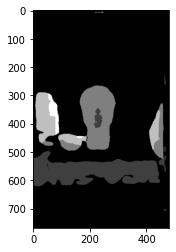

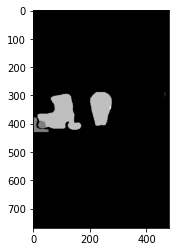

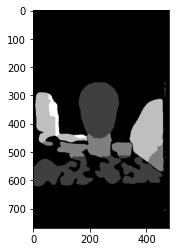

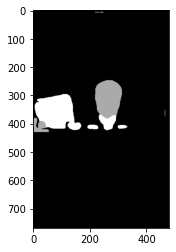

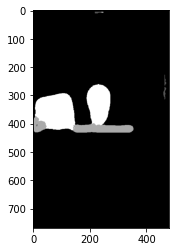

...

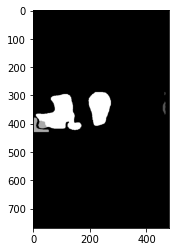

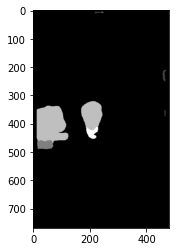

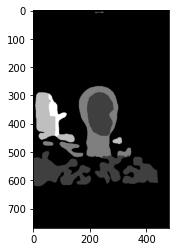

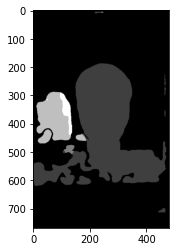

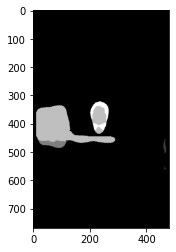

In [32]:
for imgfile in imglist2:
    img = cv2.imread(str(imgfile))
#     ic(img.max())
    img2 = normalize(img)
    plt.imshow(img2)
    plt.show()
#     break

# 特征可视化

In [122]:
a = torch.tensor(2., requires_grad=True)
b = torch.tensor(3., requires_grad=True)
a
b
c = a*b
c
d = torch.tensor(4., requires_grad=True)
e = c * d
e.backward()
a.grad, b.grad, c.grad

tensor(2., requires_grad=True)

tensor(3., requires_grad=True)

tensor(6., grad_fn=<MulBackward0>)

/tmp/ipykernel_9322/386436537.py:10: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  a.grad, b.grad, c.grad


(tensor(12.), tensor(8.), None)

## HOOK

In [115]:
def c_hook(grad):
    print(f"{grad=}")
    return grad

In [121]:
a = torch.tensor(2., requires_grad=True)
b = torch.tensor(3., requires_grad=True)
a
b
c = a*b
c1 = c.register_hook(c_hook)

d = torch.tensor(4., requires_grad=True)
e = c * d
e.backward()
a.grad, b.grad, c.grad
c1.remove()

tensor(2., requires_grad=True)

tensor(3., requires_grad=True)

grad=tensor(4.)


/tmp/ipykernel_9322/3982460681.py:11: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  a.grad, b.grad, c.grad


(tensor(12.), tensor(8.), None)

## backward_hook

In [1]:
import torchvision
from PIL import Image

In [3]:
def c1_hook(grad, inputs, outputs):
    print(f"{inputs=}")
    print(f"{outputs=}")
    return outputs

In [4]:
mymodel = torchvision.models.vgg11_bn(pretrained=True)

/home/wenquanshan/miniconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/home/wenquanshan/miniconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG11_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG11_BN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [5]:
mymodel

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU(inplace=True)
    (14): MaxPool2d(ke

In [6]:
for name, module in mymodel.named_modules():
    if (name == 'features'):
        print(module)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (6): ReLU(inplace=True)
  (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (10): ReLU(inplace=True)
  (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (13): ReLU(inplace=True)
  (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, cei

In [7]:
def imagenet_transform(image):
    transforms = torchvision.transforms.Compose([
        torchvision.transforms.Resize(256),
        torchvision.transforms.CenterCrop(224),
        torchvision.transforms.ToTensor()
    ])
    return transforms(image).unsqueeze(0)

In [8]:
testimg = Image.open("cat01.jpg")
# testimg.show()

In [9]:
y = mymodel(imagenet_transform(testimg))

In [10]:
torch.argmax(y)

tensor(937)

In [18]:
class Gradcam:
    def __init__(self, model):
        self.model = model
        self.feature = None
        self.gradient = None
    def restore_gradient(self, gradient):
        self.gradient = gradient
    @staticmethod
    def Normalize(ts):
        minv = np.min(ts)
        ranv = np.max(ts) - minv
        ts -= minv
        if (ranv != 0):
            ts /= ranv
        return ts
    def __call__(self, x):
        img_size = (x.size(-1), x.size(-2))
        x = torch.autograd.Variable(x)
#         print(x.shape)
        assert x.size(0) == 1
        image = x[0].detach().cpu().numpy()
        image = Gradcam.Normalize(image)
        feature = x[0].unsqueeze(0)
#         print(feature.shape)
        for name, module in self.model.named_children():
            if (name == "classifier"):
#                 print(feature.shape)
                feature = feature.view(feature.size(0), -1)
#             print(feature.shape)
#             print(f"1-{feature.shape=}")
            feature = module(feature)
#             print(f"2-{feature.shape=}")
            if (name == "features"):
                feature.register_hook(self.restore_gradient)
                self.feature = feature
        classes = torch.sigmoid(feature)
#         print(classes.shape)
        one_hot, idx = classes.max(dim=-1)
#         print(one_hot)
#         print(idx)
        self.model.zero_grad()
        one_hot.backward()
#         print(self.gradient.shape)
        weight = self.gradient.mean(dim=-1, keepdim=True).mean(dim=-2, keepdim=True)
#         print(weight.shape)
        saliency = torch.nn.functional.relu((weight*self.feature).sum(dim=1).squeeze(0))
#         print(saliency.shape)
        saliency = cv2.resize(saliency.detach().cpu().numpy(), img_size)
        saliency = Gradcam.Normalize(saliency)
        saliency = np.uint8(255*saliency)
#         plt.imshow(saliency)
        saliency = np.float32(cv2.applyColorMap(saliency, cv2.COLORMAP_JET))
#         plt.imshow(saliency)
        cam = 0.7 * saliency + 0.3*np.float32(np.uint8(image.transpose((1,2,0))*255))
        cam = Gradcam.Normalize(cam)
        cam = np.uint8(cam*255)
        return idx, cam
idx, cam = Gradcam(mymodel)(imagenet_transform(testimg))

torch.Size([1, 512, 7, 7])


(torch.Size([1]), (224, 224, 3), tensor([883]))

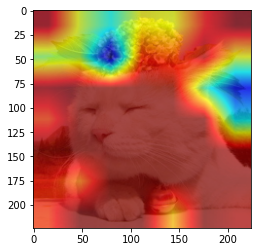

In [12]:
idx,cam = Gradcam(mymodel)(imagenet_transform(testimg))
idx.shape, cam.shape, idx
plt.imshow(cam)

In [189]:
x = torch.arange(4).reshape(2,2)
x
x.max(-1)

tensor([[0, 1],
        [2, 3]])

torch.return_types.max(
values=tensor([1, 3]),
indices=tensor([1, 1]))

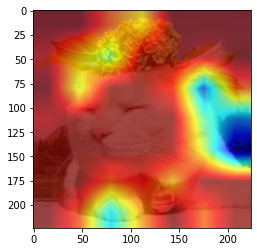

# free

In [220]:
a = 2
b = struct.pack("I", a)
b
print(b)
sys.getsizeof(a)

b'\x02\x00\x00\x00'

b'\x02\x00\x00\x00'


28

In [254]:
a = [1, 2, 100, 200, 300, 400]
a1 = a + [500]
b = struct.pack(f"{len(a)}i", *a)
b1 = struct.pack(f"{len(a1)}i", *a1)
b
print(b1)
sys.getsizeof(a)
len(a)

b'\x01\x00\x00\x00\x02\x00\x00\x00d\x00\x00\x00\xc8\x00\x00\x00,\x01\x00\x00\x90\x01\x00\x00'

b'\x01\x00\x00\x00\x02\x00\x00\x00d\x00\x00\x00\xc8\x00\x00\x00,\x01\x00\x00\x90\x01\x00\x00\xf4\x01\x00\x00'


152

6

In [248]:
for i in range(100,103):
    print(i, struct.pack("I", i))

100 b'd\x00\x00\x00'
101 b'e\x00\x00\x00'
102 b'f\x00\x00\x00'


In [233]:
print(f"a{chr(13)}{chr(10)}b")

a
b


In [234]:
print(f"a{chr(13)}b")

b


In [231]:
ord('\n'), chr(97)

(10, 'a')

In [261]:
0xf000

61440

In [5]:
torch.cuda.device_count()

8

In [7]:
a = 0.0074+0.1546
a
a/2

0.16199999999999998

0.08099999999999999

array([[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
        16, 17, 18, 19]])

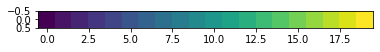

In [12]:
a = np.random.randint(0,10, size=(10, 10))
a = np.arange(20).reshape(1, -1)
a
plt.imshow(a)

In [19]:
print(26)
for i in range(26):
    print(f"{chr(i+ord('a'))} {random.randint(0, 100)}")

26
a 65
b 5
c 1
d 30
e 89
f 6
g 2
h 10
i 37
j 35
k 24
l 52
m 61
n 100
o 9
p 23
q 21
r 56
s 0
t 88
u 45
v 89
w 26
x 52
y 56
z 8


In [25]:
n = 3
print(n)
for i in range(n):
    print(f"{i+ord('a')} {random.randint(0, 100)}")

3
97 71
98 81
99 90


In [26]:
100 ** 149 % 323569

99513

In [28]:
(2 **157) % 378767

31468

In [29]:
19 * -18701 % 355320

1

In [32]:
19 * -18701

-355319

In [30]:
19 * -189221 % 513600

1

In [33]:
1+2<<1


6

In [36]:
start = 5
end = 10
mid = (start + (end - start + 1) >> 1)
mid

5

In [37]:
(127)*64

8128

In [38]:
import struct

In [40]:
a = 3
b = struct.pack("I", a)
b

b'\x03\x00\x00\x00'

In [41]:
c = struct.unpack("I", b)
c

(3,)

In [44]:
with open("a.txt", 'rb') as f:
    a = f.read()

In [45]:
a

b'hello'

In [49]:
len(a)

5

In [69]:
list(*a.split())

[104, 101, 108, 108, 111]

In [83]:
b = struct.pack(f"{len(a)}I", *list(*a.split()))
b

b'h\x00\x00\x00e\x00\x00\x00l\x00\x00\x00l\x00\x00\x00o\x00\x00\x00'

In [87]:
b = struct.pack(f"{len(a)}I", *list(a))
b

b'h\x00\x00\x00e\x00\x00\x00l\x00\x00\x00l\x00\x00\x00o\x00\x00\x00'

In [84]:
c = struct.unpack(f"{len(a)}I",b)
c

(104, 101, 108, 108, 111)

In [86]:
for x in c:
    chr(x)

'h'

'e'

'l'

'l'

'o'

In [82]:
b = struct.pack(f"{len(a)}I", a)
b

error: pack expected 5 items for packing (got 1)

In [81]:
for i in range(len(a)):
    type(a[i])


int

int

int

int

int

In [53]:
struct.pack?

In [78]:
struct.calcsize("b")

1